<a href="https://colab.research.google.com/github/rlskoeser/shxco-missingdata-specreading/blob/main/missing-data/Sco_prophet_missingdata_altairgraphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
%%capture
!pip install prophet

In [2]:
# use v1.2 datasets
csv_urls = {
    #  previously loaded from our repo for now since not yet published on dataspace
    # 'members': 'https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/dataset_generator/source_data/SCoData_members_v1.2_2022-01.csv',
    # 'books': 'https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/dataset_generator/source_data/SCoData_books_v1.2_2022-01.csv',
    # 'events': 'https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/dataset_generator/source_data/SCoData_events_v1.2_2022-01.csv',

    # official published versions 
    'members': 'https://dataspace.princeton.edu/bitstream/88435/dsp01dv13zx35z/2/SCoData_members_v1.2_2022-01.csv',
    'books': 'https://dataspace.princeton.edu/bitstream/88435/dsp01jm214s28p/2/SCoData_books_v1.2_2022-01.csv',
    'events': 'https://dataspace.princeton.edu/bitstream/88435/dsp019306t2441/2/SCoData_events_v1.2_2022-01.csv',

    # project-specific data
    'partial_borrowers': 'https://github.com/ZoeLeBlanc/unknown_borrowers/raw/main/dataset_generator/data/partial_borrowers_collapsed.csv',
    'borrow_overrides': 'https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/dataset_generator/data/long_borrow_overrides.csv'
}

## load logbook event data

In [3]:
import pandas as pd

# load events
events_df = pd.read_csv(csv_urls['events'])

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (20) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
# limit to logbook events

logbook_events_df = events_df[events_df.source_type.str.contains('Logbook')][[
   'event_type', 'start_date', 'end_date', 'subscription_purchase_date',
   'member_uris',
   'subscription_duration', 'subscription_duration_days',
   'subscription_volumes', 'subscription_category',
   'source_type'
]]
# .dropna(subset=['start_date'])

logbook_events_df['start_date'] = pd.to_datetime(logbook_events_df['start_date'])
logbook_events_df['subscription_purchase_date'] = pd.to_datetime(logbook_events_df['subscription_purchase_date'])


In [5]:
logbook_events_df.event_type.value_counts()

Renewal             4398
Subscription        4168
Reimbursement       2762
Supplement           190
Separate Payment      83
Name: event_type, dtype: int64

In [6]:
logbook_events_df.source_type.value_counts()

Logbook                                              8324
Logbook;Address Book                                 2079
Logbook;Lending Library Card                         1077
Lending Library Card;Logbook                           59
Logbook;Lending Library Card;Address Book              54
Logbook;Lending Library Card;Lending Library Card       5
Logbook;Address Book;Lending Library Card               2
Lending Library Card;Logbook;Address Book               1
Name: source_type, dtype: int64

In [7]:
# set logbook date; for subscriptions, the date recorded in the logbook is purchase date instead of start date
logbook_events_df['logbook_date'] = logbook_events_df.apply(lambda row: row.subscription_purchase_date if pd.notna(row.subscription_purchase_date) else row.start_date, axis=1)
logbook_events_df.dropna(subset=['logbook_date'])
logbook_events_df

,event_type,start_date,end_date,subscription_purchase_date,member_uris,subscription_duration,subscription_duration_days,subscription_volumes,subscription_category,source_type,logbook_date
17,Subscription,1925-01-01,NaN,1925-01-01,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1925-01-01
114,Subscription,1934-01-01,NaN,1934-01-01,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1934-01-01
433,Subscription,1930-05-01,1930-10,1930-05-01,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook;Address Book,1930-05-01
671,Subscription,1919-11-17,1919-12-17,1919-11-17,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,NaN,Lending Library Card;Logbook,1919-11-17
672,Subscription,1919-11-18,1919-12-18,1919-11-18,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,Student,Logbook;Lending Library Card,1919-11-18
...,...,...,...,...,...,...,...,...,...,...,...
35115,Renewal,1941-11-24,1941-12-24,1941-11-24,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,NaN,Logbook,1941-11-24
35116,Renewal,1941-12-04,1942-01-04,1941-12-04,https://shakespeareandco.princeton.edu/members...,1 month,31.0,1.0,NaN,Logbook,1941-12-04
35117,Reimbursement,1941-12-04,1941-12-04,NaT,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1941-12-04
35118,Renewal,1941-12-08,1942-03-08,1941-12-08,https://shakespeareandco.princeton.edu/members...,3 months,90.0,2.0,A,Logbook,1941-12-08


In [8]:
# check non-logbook membership events
membership_events = events_df[events_df.event_type.isin(['Renewal', 'Subscription', 'Reimbursement' ,'Supplement', 'Separate Payment'])]
nonlogbook_membership_events = membership_events[~membership_events.source_type.str.contains('Logbook')]
nonlogbook_membership_events

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,item_uri,item_title,item_volume,item_authors,item_year,item_notes,source_type,source_citation,source_manifest,source_image
1,Subscription,1921,NaN,https://shakespeareandco.princeton.edu/members...,Mme Garreta,"Garreta, Mme",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
4,Subscription,1922,NaN,https://shakespeareandco.princeton.edu/members...,Mr. Lincoln,"Lincoln, Mr.",NaN,7.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
6,Subscription,1923,1923,https://shakespeareandco.princeton.edu/members...,S. Q. Millward,"Millward, S. Q.",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
7,Subscription,1923,NaN,https://shakespeareandco.princeton.edu/members...,Mr. Foulquier,"Foulquier, Mr.",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
9,Subscription,1923,NaN,https://shakespeareandco.princeton.edu/members...,Mrs. Hefferson,"Hefferson, Mrs.",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35512,Reimbursement,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Mrs. N. F. Connont,"Connont, Mrs. N. F.",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
35517,Reimbursement,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Austin Clarke,"Clarke, Austin",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
35518,Reimbursement,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Henri Gutmann,"Gutmann, Henri",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN
35520,Reimbursement,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Mr. Baldwin,"Baldwin, Mr.",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Address Book,"Sylvia Beach, Address Book 1919–1935, box 69, ...",NaN,NaN


### aggregate logbook activity by month

## calculate logbook gaps

In [9]:
import requests

# load our dataset of known logbook dates to determine coverage
response = requests.get('https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/missing-data-estimates/logbook-dates.json')
logbook_dates = response.json()
# these are the dates that are *covered* by the logbooks we have
logbook_dates

[{'startDate': '1919-11-17', 'endDate': '1923-12-31'},
 {'startDate': '1924-01-02', 'endDate': '1927-10-29'},
 {'startDate': '1927-11-02', 'endDate': '1927-12-31'},
 {'startDate': '1928-03-01', 'endDate': '1928-04-30'},
 {'startDate': '1928-05-01', 'endDate': '1928-12-31'},
 {'startDate': '1929-01-02', 'endDate': '1929-11-30'},
 {'startDate': '1929-12-02', 'endDate': '1930-01-02'},
 {'startDate': '1930-06-02', 'endDate': '1930-07-31'},
 {'startDate': '1931-01-01', 'endDate': '1931-02-16'},
 {'startDate': '1932-09-26', 'endDate': '1934-02-06'},
 {'startDate': '1934-02-09', 'endDate': '1934-12-31'},
 {'startDate': '1935-01-12', 'endDate': '1935-12-28'},
 {'startDate': '1936-01-02', 'endDate': '1936-12-31'},
 {'startDate': '1938-02-17', 'endDate': '1938-05-05'},
 {'startDate': '1938-10-21', 'endDate': '1939-08-28'},
 {'startDate': '1939-09-13', 'endDate': '1941-12-12'}]

In [10]:
from datetime import timedelta

# adapted from KM's notebook

# don't consider gaps shorter than 15 days
MIN_GAP_DAYS = 15

logbook_gaps = []
skipped_gaps = []

oneday = timedelta(days=1)


for i in range(len(logbook_dates) - 1):
  # gaps are between the logbook dates, so gap start is end of the first
  # and gap end is the start of the next

  # NOTE: adjusted from KM implementation: k
  # gap start and end dates are now included in the range instead of bounds outside the range
  gap_start = pd.to_datetime(logbook_dates[i]['endDate']) + oneday
  gap_end = pd.to_datetime(logbook_dates[i+1]['startDate']) - oneday
  interval = { 'start': gap_start, 'end': gap_end, 'days': (gap_end - gap_start).days }

  if interval['days'] > MIN_GAP_DAYS:
      logbook_gaps.append(interval)
  else:
     skipped_gaps.append(interval)


print(f"The {len(logbook_gaps)} large gaps in the logbooks")
for interval in logbook_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} days)")

print(f"\nThe {len(skipped_gaps)} small gaps in the logbooks that will be skipped")
for interval in skipped_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} day{'s' if interval['days'] != 1 else ''})")

The 6 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)

The 9 small gaps in the logbooks that will be skipped
	January 01 1924 to January 01 1924 (0 days)
	October 30 1927 to November 01 1927 (2 days)
	May 01 1928 to April 30 1928 (-1 days)
	January 01 1929 to January 01 1929 (0 days)
	December 01 1929 to December 01 1929 (0 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)
	August 29 1939 to September 12 1939 (14 days)


In [11]:
logbooks_monthly_count = logbook_events_df.groupby([pd.Grouper(key='logbook_date', freq='MS')])['event_type'].count().reset_index()
logbooks_monthly_count.rename(columns={'event_type': 'total'}, inplace=True)
logbooks_monthly_count

,logbook_date,total
0,1919-11-01,24
1,1919-12-01,30
2,1920-01-01,35
3,1920-02-01,25
4,1920-03-01,31
...,...,...
270,1942-05-01,3
271,1942-06-01,1
272,1942-07-01,0
273,1942-08-01,0


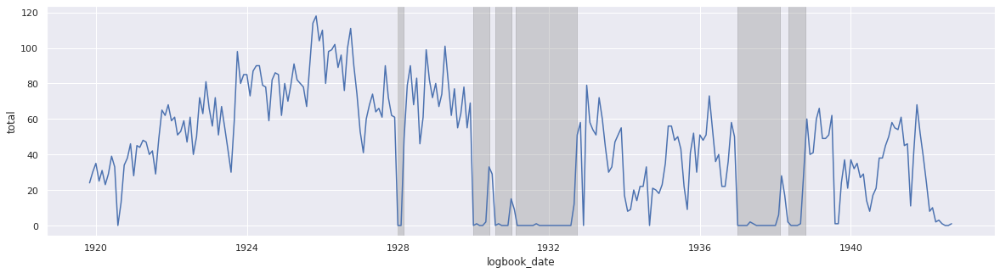

In [12]:
# plot the monthly count we have from logbooks against the gaps
# (adapted from KM notebook)
from matplotlib import pyplot as plt
import seaborn as sns


sns.set(rc = {'figure.figsize':(20,8)})

fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=logbooks_monthly_count, x='logbook_date', y='total')

for gap in logbook_gaps:
  ax.axvspan(pd.to_datetime(gap['start']), pd.to_datetime(gap['end']), color="gray", alpha=0.3)

In [13]:
logbook_gaps

[{'start': Timestamp('1928-01-01 00:00:00'),
  'end': Timestamp('1928-02-29 00:00:00'),
  'days': 59},
 {'start': Timestamp('1930-01-03 00:00:00'),
  'end': Timestamp('1930-06-01 00:00:00'),
  'days': 149},
 {'start': Timestamp('1930-08-01 00:00:00'),
  'end': Timestamp('1930-12-31 00:00:00'),
  'days': 152},
 {'start': Timestamp('1931-02-17 00:00:00'),
  'end': Timestamp('1932-09-25 00:00:00'),
  'days': 586},
 {'start': Timestamp('1937-01-01 00:00:00'),
  'end': Timestamp('1938-02-16 00:00:00'),
  'days': 411},
 {'start': Timestamp('1938-05-06 00:00:00'),
  'end': Timestamp('1938-10-20 00:00:00'),
  'days': 167}]

In [14]:
import altair as alt

chart_height = 275

base = alt.Chart(logbooks_monthly_count).encode(
    alt.X('logbook_date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=chart_height
)

line = base.mark_line(stroke='#5276A7').encode(
    alt.Y('total',
          axis=alt.Axis(title='total', titleColor='#5276A7'))
)


gap_areas = None
for gap in logbook_gaps:
  # ax.axvspan(pd.to_datetime(gap['start']), pd.to_datetime(gap['end']), color="gray", alpha=0.3)

  # construct a dataframe for each gap so we can mark a rectangle
  # the full height of the graph
  # adapted from https://github.com/altair-viz/altair/issues/2348

  rect_df = pd.DataFrame({
      'x1': [pd.to_datetime(gap['start'])],
      'x2': [pd.to_datetime(gap['end'])],
  })
  area = alt.Chart(rect_df).mark_rect(opacity=0.3, color='gray').encode(
      x='x1', x2='x2',
      y=alt.value(0), y2=alt.value(chart_height)
  )

  if gap_areas is None:
    gap_areas = area 
  else:
    gap_areas += area

line + gap_areas

alt.LayerChart(...)

In [15]:
# get logbook event data *except* for during gaps

logbook_events_nogaps = logbook_events_df.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  logbook_events_nogaps = logbook_events_nogaps[~((logbook_events_nogaps.logbook_date >= gap_start) & (logbook_events_nogaps.logbook_date <= gap_end))]

logbook_events_nogaps

,event_type,start_date,end_date,subscription_purchase_date,member_uris,subscription_duration,subscription_duration_days,subscription_volumes,subscription_category,source_type,logbook_date
17,Subscription,1925-01-01,NaN,1925-01-01,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1925-01-01
114,Subscription,1934-01-01,NaN,1934-01-01,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1934-01-01
671,Subscription,1919-11-17,1919-12-17,1919-11-17,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,NaN,Lending Library Card;Logbook,1919-11-17
672,Subscription,1919-11-18,1919-12-18,1919-11-18,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,Student,Logbook;Lending Library Card,1919-11-18
676,Subscription,1919-11-18,1919-12-18,1919-11-18,https://shakespeareandco.princeton.edu/members...,1 month,30.0,2.0,Student,Logbook;Lending Library Card,1919-11-18
...,...,...,...,...,...,...,...,...,...,...,...
35115,Renewal,1941-11-24,1941-12-24,1941-11-24,https://shakespeareandco.princeton.edu/members...,1 month,30.0,1.0,NaN,Logbook,1941-11-24
35116,Renewal,1941-12-04,1942-01-04,1941-12-04,https://shakespeareandco.princeton.edu/members...,1 month,31.0,1.0,NaN,Logbook,1941-12-04
35117,Reimbursement,1941-12-04,1941-12-04,NaT,https://shakespeareandco.princeton.edu/members...,NaN,NaN,NaN,NaN,Logbook,1941-12-04
35118,Renewal,1941-12-08,1942-03-08,1941-12-08,https://shakespeareandco.princeton.edu/members...,3 months,90.0,2.0,A,Logbook,1941-12-08


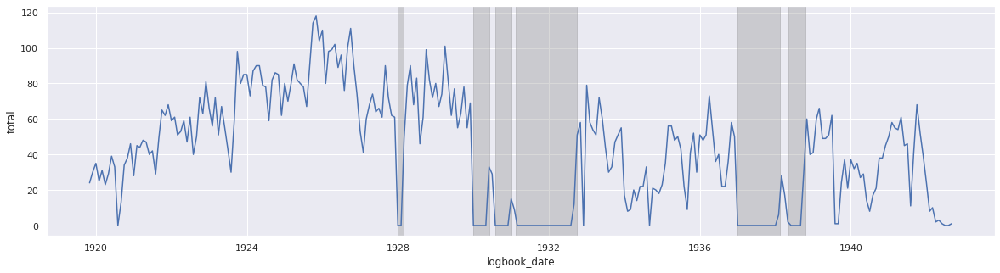

In [16]:
# plot logbooks with no gaps to check logic

logbook_events_nogaps_monthly = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='MS')])['event_type'].count().reset_index()
logbook_events_nogaps_monthly.rename(columns={'event_type': 'total'}, inplace=True)
logbook_events_nogaps_monthly

sns.set(rc = {'figure.figsize':(20,8)})

fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=logbook_events_nogaps_monthly, x='logbook_date', y='total')

for gap in logbook_gaps:
  ax.axvspan(pd.to_datetime(gap['start']), pd.to_datetime(gap['end']), color="gray", alpha=0.3)

In [17]:
# redo the same plot in altair

base = alt.Chart(logbook_events_nogaps_monthly).encode(
    alt.X('logbook_date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=chart_height
)

line = base.mark_line(stroke='#5276A7').encode(
    alt.Y('total',
          axis=alt.Axis(title='total', titleColor='#5276A7'))
)
line + gap_areas

alt.LayerChart(...)

# missing membership events

## use prophet to forecast missing membership events in logbook gaps

Because there's a significant difference between 1920s and 1930s data, and there's a big gap in 1931-1932, for the gaps after 1936 we only want to fit and forecast based on data after the 1932 gap.

These are the gaps in question:
- February 16 1931 to September 26 1932 (588 days)
- December 31 1936 to February 17 1938 (413 days)

## aggregate by month


In [18]:
from datetime import date, timedelta
import math

from prophet import Prophet

# show some number of months before/after the gap and forecast
near_gap = timedelta(days=30 * 6)

# lists to aggregate forecasts and models
all_forecasts_dfs = []
all_gap_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  monthly_m = Prophet()
  gap_start = gap['start']
  print('forecasting %s' % gap)

  # preceding_data = logbooks_monthly_count[logbooks_monthly_count.logbook_date < gap_start]
  preceding_data = logbook_events_nogaps_monthly[logbook_events_nogaps_monthly.logbook_date < gap_start]

  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.logbook_date >= post1932 ]

  # drop any zeroes for preceding months, so that prophet doesn't fit to missing data
  # (zero for an entire month means missing logbook data)
  # preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit thed ata
  monthly_m.fit(preceding_data.rename(columns={'logbook_date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = math.ceil(gap['days']/ 30) + 2
  print('gap is %s days, forecast for %0.2f months' % (gap['days'], forecast_for))
  months_future = monthly_m.make_future_dataframe(periods=forecast_for, freq='MS')
  months_fcst = monthly_m.predict(months_future)

  # plot the forecast around our gap
  forecast_near_gap = months_fcst[(months_fcst.ds > (gap_start - near_gap)) & (months_fcst.ds < (gap_end + near_gap))]
  # display(forecast_near_gap.head())
  all_gap_forecasts_dfs.append(forecast_near_gap)

  all_forecasts_dfs.append(months_fcst.copy())

# combine all the forecasts into a single df
logbooks_forecast = pd.concat(all_forecasts_dfs)
all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

logbooks_forecast


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/himogch3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/xzo7mqgk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None


forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92484', 'data', 'file=/tmp/tmpr6ojztkn/himogch3.json', 'init=/tmp/tmpr6ojztkn/xzo7mqgk.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model7ww2vdn5/prophet_model-20230113151414.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:14:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 4.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/5bbut3g8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/ygxic1fm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59190', 'data', 'file=/tmp/tmpr6ojztkn/5bbut3g8.json', 'init=/tmp/tmpr6ojztkn/ygxic1fm.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model90s5_jes/prophet_model-20230113151417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}


15:14:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecast for 7.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/0jvegegu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/3geg57rq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13421', 'data', 'file=/tmp/tmpr6ojztkn/0jvegegu.json', 'init=/tmp/tmpr6ojztkn/3geg57rq.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelza3kln38/prophet_model-20230113151419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}


15:14:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecast for 8.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/u1414_6c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/9_urxm36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26661', 'data', 'file=/tmp/tmpr6ojztkn/u1414_6c.json', 'init=/tmp/tmpr6ojztkn/9_urxm36.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model0mfvt3uy/prophet_model-20230113151421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 22.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/zy0jblk5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/ii5nq1u6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43883', 'data', 'file=/tmp/tmpr6ojztkn/zy0jblk5.json', 'init=/tmp/tmpr6ojztkn/ii5nq1u6.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modeladmljcbp/prophet_model-20230113151422.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:14:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}


15:14:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 411 days, forecast for 16.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/khm9niow.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/eejpkwg3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82989', 'data', 'file=/tmp/tmpr6ojztkn/khm9niow.json', 'init=/tmp/tmpr6ojztkn/eejpkwg3.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelacv0jqo3/prophet_model-20230113151424.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:14:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}


15:14:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 167 days, forecast for 8.00 months


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-01,27.725634,13.080082,41.084672,27.725634,27.725634,-0.386098,-0.386098,-0.386098,-0.386098,-0.386098,-0.386098,0.0,0.0,0.0,27.339536
1,1919-12-01,28.592213,17.706021,47.054852,28.592213,28.592213,3.715341,3.715341,3.715341,3.715341,3.715341,3.715341,0.0,0.0,0.0,32.307554
2,1920-01-01,29.487679,20.693803,48.846783,29.487679,29.487679,5.374351,5.374351,5.374351,5.374351,5.374351,5.374351,0.0,0.0,0.0,34.862029
3,1920-02-01,30.383144,9.106343,37.926013,30.383144,30.383144,-6.929248,-6.929248,-6.929248,-6.929248,-6.929248,-6.929248,0.0,0.0,0.0,23.453896
4,1920-03-01,31.220837,17.999616,46.283009,31.220837,31.220837,1.219108,1.219108,1.219108,1.219108,1.219108,1.219108,0.0,0.0,0.0,32.439945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,1938-09-01,10.076128,-36.917357,11.215115,10.076050,10.076205,-21.747350,-21.747350,-21.747350,-21.747350,-21.747350,-21.747350,0.0,0.0,0.0,-11.671221
72,1938-10-01,9.495225,-15.726851,29.194817,9.495115,9.495331,-1.607938,-1.607938,-1.607938,-1.607938,-1.607938,-1.607938,0.0,0.0,0.0,7.887287
73,1938-11-01,8.894959,-11.355136,34.077353,8.894813,8.895105,3.201485,3.201485,3.201485,3.201485,3.201485,3.201485,0.0,0.0,0.0,12.096444
74,1938-12-01,8.314056,-21.526226,22.657375,8.313869,8.314245,-7.366401,-7.366401,-7.366401,-7.366401,-7.366401,-7.366401,0.0,0.0,0.0,0.947654


### plot prophet model and forecast

In [149]:
# plot the forecast against our actual data
# plot using altair, since matplotlib can't handle the upper/lower prediction area

def plot_forecast(known_df, forecast_df, all_gap_forecasts_df, show_model=False, separate_model_decades=False):
  # parameters:
  # known_df : documented information used for predicting; should have date and total
  # forecast_df : forecast generated by prophet. (= model ? )
  # gap_forecast_df:  forecast for all gaps
  # show_model: should the graph include the model?
  # separate_model_decates: should the model be graphed in two separate chunks?

  # because we're forecasting multiple times, we need to drop duplicates
  forecast_uniq = forecast_df.drop_duplicates(keep='last').reset_index(drop=True)

  all_gap_forecasts_uniq = all_gap_forecasts_df.drop_duplicates(keep='last').reset_index(drop=True)


  base = alt.Chart(known_df).encode(
      alt.X('date:T', axis=alt.Axis(title='date'))  
  ).properties(
      width=1200,
      height=chart_height
  )

  line_width = 1


  # label as documented information
  known_df['label'] = "documented"
  logbook_line = base.mark_line(stroke='#5276A7', strokeWidth=line_width).encode(
      alt.Y('total',
            axis=alt.Axis(title='total', titleColor='#5276A7')),
      color=alt.Color('label', title="" ),
  )


  graph = logbook_line

  # limit y scale at zero even though predictions dip below
  max_y = known_df.total.max()   # use highest known total to set the y range
  y_scale = alt.Scale(domain=(0, max_y + 5), clamp=True)

  # plot the model fit faintly if requested
  if show_model:

    if separate_model_decades:
      forecast_pre1932 = forecast_uniq[forecast_uniq.ds < post1932]
      forecast_post1932 = forecast_uniq[forecast_uniq.ds > post1932]

      forecast_pre1932['label'] = "forecast model - 1920s"
      forecast_base1 = alt.Chart(forecast_pre1932).encode(alt.X('ds:T'))
      forecast_line1 = forecast_base1.mark_line(stroke="red", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), color=alt.Color('label', title="" ))

      forecast_post1932["label"] = "forecast model - 1930s"
      forecast_base2 = alt.Chart(forecast_post1932).encode(alt.X('ds:T'))
      forecast_line2 = forecast_base2.mark_line(stroke="purple", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), color=alt.Color('label', title="" ))

      graph += forecast_line1 
      graph += forecast_line2
      # sns.lineplot(data=forecast_pre1932, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='1920s forecast model')
      # sns.lineplot(data=forecast_post1932, x='ds', y='yhat', ax=ax, color="purple", alpha=0.5, label='1930s forecast model')

    else:
      # sns.lineplot(data=forecast_uniq, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='forecast model')
      # ?? how is this plotting the error bars? or is it doing something else?
      forecast_base = alt.Chart(forecast_uniq) # .encode(alt.X('ds:T'))
      forecast_uniq['label'] = 'forecast model' # define label
      forecast_line = forecast_base.mark_line(stroke="red", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), 
          color=alt.Color('label', title='') # set label without heading
        ) 

      graph += forecast_line    

  onemonth = timedelta(days=30)
  for i, gap in enumerate(logbook_gaps): 
    gap_start = pd.to_datetime(gap['start'])
    gap_end = pd.to_datetime(gap['end'])
    # ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

    # NOTE: may want to adjust dates for partial months; for now, just include month before/after

    # gap_forecast = forecast_uniq[(forecast_uniq.ds >= gap_start - onemonth) & (forecast_uniq.ds <= gap_end + onemonth)]

    gap_forecast = all_gap_forecasts_uniq[(all_gap_forecasts_uniq.ds >= gap_start - onemonth) & (all_gap_forecasts_uniq.ds <= gap_end + onemonth)]
    # only output label on the first one
    plot_opts = {}
    if i == 0:      
      gap_forecast['label'] = 'forecast'
      plot_opts['color'] = alt.Color('label', title='')

    gap_base = alt.Chart(gap_forecast).encode(alt.X('ds:T'))
    line = gap_base.mark_line(stroke="orange", strokeWidth=line_width).encode(
        alt.X('ds:T'), alt.Y('yhat', scale=y_scale), **plot_opts
        # alt.X('ds:T'), alt.Y('yhat', scale=alt.Scale(domain=(0, 120))), **plot_opts
    )
    graph += line
   
    area = gap_base.mark_area(opacity=0.3, color='orange').encode(
        alt.Y('yhat_lower', scale=y_scale),
        alt.Y2('yhat_upper'), 
    )
    graph += area


    # # only output label on the first one
    # plot_opts = {}
    # if i == 0:
    #   plot_opts['label'] = 'forecast'
    # sns.lineplot(data=gap_forecast, x='ds', y='yhat', ax=ax, color="orange", **plot_opts)
    # # something is wrong with the fill between here...
    # fill_plot_opts = {}
    # if i == 0:
    #   fill_plot_opts['label'] = 'forecast bounds'
    # ax.fill_between(x='ds', y1='yhat_lower', y2='yhat_upper', data=gap_forecast, color="orange", alpha=0.2, step='mid', **fill_plot_opts)

  return graph  + gap_areas 
 

In [20]:
logbook_events_nogaps_monthly.total.max()

118

In [21]:
# plot the forecast against our actual data
# plot using altair, since matplotlib can't handle the upper/lower prediction area


def plot_logbooks_forecast(forecast_df, show_model=False, separate_model_decades=False):
  # use logbook events monthly for known values; use all gaps forecast for predictions
  return plot_forecast(logbook_events_nogaps_monthly.rename(columns={"logbook_date":"date"}), forecast_df, 
                       all_gap_forecasts, show_model=show_model, 
                       separate_model_decades=separate_model_decades)


In [147]:
plot_logbooks_forecast(logbooks_forecast)

<ipython-input-145-0513c64bd576>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [148]:
plot_logbooks_forecast(logbooks_forecast, show_model=True)

<ipython-input-145-0513c64bd576>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [150]:
plot_logbooks_forecast(logbooks_forecast, show_model=True, separate_model_decades=True)
# NOTE: can make any of these altair charts interactive simply by adding .interactive()

<ipython-input-149-8e7696927aa5>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_pre1932['label'] = "forecast model - 1920s"
<ipython-input-149-8e7696927aa5>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_post1932["label"] = "forecast model - 1930s"
<ipython-input-149-8e7696927aa5>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

alt.LayerChart(...)

### aggregate estimates from forecast

In [25]:
%%capture
!pip install DateTimeRange

In [26]:
from datetimerange import DateTimeRange
from datetime import date

onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)

missing = 0
missing_upper = 0
missing_lower = 0


estimates = []

for i, gap in enumerate(logbook_gaps): 
  # print(gap)
  gap_start = gap['start']
  gap_end = gap['end']
  print(gap_start, gap_end)
  print('gap range ')
  gap_range = DateTimeRange(gap_start, gap_end)
  print(gap_range)
  # get documented counts for this time period

  # pandas aggregation uses end of month, so mid-month will get the first month count;
  # extend to end by one month to make sure we get the full month for any partials

  gap_counts = logbooks_monthly_count[(logbooks_monthly_count.logbook_date >= gap_start) & (logbooks_monthly_count.logbook_date <= gap_end + onemonth)]
  print(gap_counts.head())
  # now get the forecast for the same months
  forecast = logbooks_forecast[(logbooks_forecast.ds >= gap_start) & (logbooks_forecast.ds <= gap_end + onemonth)]
  print(forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())
  # these dates don't match exactly! prophet build monthly periodic forecast is different than pandas month grouper;
  # they are usually within a few days of each other, so find them that way
  for month in gap_counts.itertuples():
    # aggregating with MS, monthly counts uses first of month
    month_start = month.logbook_date 

    # check if the month padding put us past the end of the current gap
    if month_start > gap_end:
      continue

    # get the end of the same month (first of the next month minus one day)
    month_end = month_start + onemonth - oneday
    # how many days from this month overlap with our gap?
    gap_intersection = gap_range.intersection(DateTimeRange(month_start, month_end))
    overlap_days = gap_intersection.timedelta.days
    print('gap overlap for %s is %d days' % (month_end, overlap_days))
    # what is our threshold for using the forecast value instead of recorded? 
    # let's try 10 days
    if overlap_days > 10:
      # get the forecast value for this month
      month_forecast = forecast[(forecast.ds >= month_start - fivedays) & (forecast.ds <= month_end + fivedays) ].iloc[0]
      # missing estimate is the forecast value minus any actual recorded count for this month
      missing += max(0, (max(0, month_forecast.yhat) - month.total))
      missing_upper += (month_forecast.yhat_upper - month.total)
      # cap lower estimate at zero
      missing_lower += max(0, (max(0, month_forecast.yhat_lower) - month.total))

      # aggregate forecast values so we can output as csv for reference
      estimates.append({
          'date': month_end,
          'documented_total': month.total,
          'gap_days': overlap_days,
          'forecast': month_forecast.yhat,
          'forecast_upper': month_forecast.yhat_upper,
          'forecast_lower': month_forecast.yhat_lower,
          'forecast_range': month_forecast.yhat_upper - month_forecast.yhat_lower,
      })

print('''\n\nmissing estimates:
  %s
  upper: %s
  lower: %s''' % (missing, missing_upper, missing_lower))

1928-01-01 00:00:00 1928-02-29 00:00:00
gap range 
1928-01-01T00:00:00 - 1928-02-29T00:00:00
    logbook_date  total
98    1928-01-01      0
99    1928-02-01      0
100   1928-03-01     49
            ds       yhat  yhat_upper  yhat_lower
98  1928-01-01  79.883831   94.582831   65.043873
99  1928-02-01  67.085043   80.130773   53.035042
100 1928-03-01  74.770157   89.035157   59.584359
98  1928-01-01  62.400402   82.225373   40.922368
99  1928-02-01  58.719976   78.633524   39.188318
gap overlap for 1928-01-27 00:00:00 is 26 days
gap overlap for 1928-02-27 00:00:00 is 26 days
1930-01-03 00:00:00 1930-06-01 00:00:00
gap range 
1930-01-03T00:00:00 - 1930-06-01T00:00:00
    logbook_date  total
123   1930-02-01      1
124   1930-03-01      0
125   1930-04-01      0
126   1930-05-01      2
127   1930-06-01     33
            ds       yhat  yhat_upper  yhat_lower
123 1930-02-01  54.750901   76.851801   33.389719
124 1930-03-01  67.605941   86.605720   47.308359
125 1930-04-01  71.709212   91

In [27]:
estimates_df = pd.DataFrame(data=estimates)
estimates_df

,date,documented_total,gap_days,forecast,forecast_upper,forecast_lower,forecast_range
0,1928-01-27,0,26,79.883831,94.582831,65.043873,29.538958
1,1928-02-27,0,26,67.085043,80.130773,53.035042,27.095731
2,1930-02-27,1,26,54.750901,76.851801,33.389719,43.462082
3,1930-03-27,0,26,67.605941,86.605720,47.308359,39.297361
4,1930-04-27,0,26,71.709212,91.230536,51.767785,39.462752
5,1930-05-27,2,26,72.951160,94.144223,51.646978,42.497244
6,1930-08-27,0,26,45.064500,65.799179,23.862476,41.936703
7,1930-09-27,1,26,48.944297,71.792566,26.776005,45.016561
8,1930-10-27,0,26,64.977087,87.046580,43.301985,43.744595
9,1930-11-27,0,26,52.485656,74.661912,30.622577,44.039335


In [28]:
estimates_df.to_csv('logbooks_prophet_missingevent_estimates.csv', index=False)

### summarize

In [29]:
# total recorded events from logbooks
logbook_total = logbooks_monthly_count.total.sum()

# membership events from outside the logbooks (largely addressbooks)
nonlogbook_total = nonlogbook_membership_events.shape[0]

actual_total = membership_events.shape[0]

# estimated totals
est_total = round(logbook_total + missing)
upper_est_total = round(logbook_total + missing_upper)
lower_est_total = round(logbook_total + missing_lower)

# logbook percentages
pct_survived = logbook_total / est_total * 100
upper_pct_survived = logbook_total / upper_est_total  * 100
lower_pct_survived = logbook_total / lower_est_total * 100

# actual/total percentages
all_pct_survived = actual_total / est_total * 100
all_upper_pct_survived = actual_total / upper_est_total  * 100
all_lower_pct_survived = actual_total / lower_est_total * 100

print(f"total events from logbooks: {logbook_total:,}")
print(f"total membership events from any source: {actual_total:,} ({nonlogbook_total:,} non-logbook membership events)")


print(f"""
logbook percentages:
undocumented events: {round(missing):,} (upper {round(missing_upper):,}, lower {round(missing_lower):,})
total estimate : {est_total:,} (upper {upper_est_total:,}, lower {lower_est_total:,}) 
% survived:  {pct_survived:.2f}% (upper estimate: {upper_pct_survived:.2f}%, lower estimate: {lower_pct_survived:.2f}%) 

total percentages:
% survived: {all_pct_survived:.2f}% (upper estimate: {all_upper_pct_survived:.2f}%, lower estimate: {all_lower_pct_survived:.2f}%) 
""")


total events from logbooks: 11,601
total membership events from any source: 13,039 (1,438 non-logbook membership events)

logbook percentages:
undocumented events: 1,594 (upper 2,620, lower 749)
total estimate : 13,195 (upper 14,221, lower 12,350) 
% survived:  87.92% (upper estimate: 81.58%, lower estimate: 93.94%) 

total percentages:
% survived: 98.82% (upper estimate: 91.69%, lower estimate: 105.58%) 



## aggregate by daily count


In [30]:
logbooks_daily_count = logbook_events_df.groupby([pd.Grouper(key='logbook_date', freq='D')])['event_type'].count().reset_index()
logbooks_daily_count.rename(columns={'event_type': 'total'}, inplace=True)
logbooks_daily_count

,logbook_date,total
0,1919-11-17,3
1,1919-11-18,4
2,1919-11-19,1
3,1919-11-20,1
4,1919-11-21,2
...,...,...
8326,1942-09-03,0
8327,1942-09-04,0
8328,1942-09-05,0
8329,1942-09-06,0


In [31]:
logbook_events_nogaps_daily = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='D')])['event_type'].count().reset_index()
logbook_events_nogaps_daily.rename(columns={'event_type': 'total'}, inplace=True)
logbook_events_nogaps_daily

,logbook_date,total
0,1919-11-17,3
1,1919-11-18,4
2,1919-11-19,1
3,1919-11-20,1
4,1919-11-21,2
...,...,...
8326,1942-09-03,0
8327,1942-09-04,0
8328,1942-09-05,0
8329,1942-09-06,0


### fit model and forecast

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/fwjya9ga.json


forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
training on data from 1919-11-17 00:00:00 to 1927-12-31 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/96oe4gmo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15070', 'data', 'file=/tmp/tmpr6ojztkn/fwjya9ga.json', 'init=/tmp/tmpr6ojztkn/96oe4gmo.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model6rg8bfo1/prophet_model-20230113151440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecasting for 59 days
plotting counts for 1927-12-01 00:00:00 to 1928-03-31 00:00:00


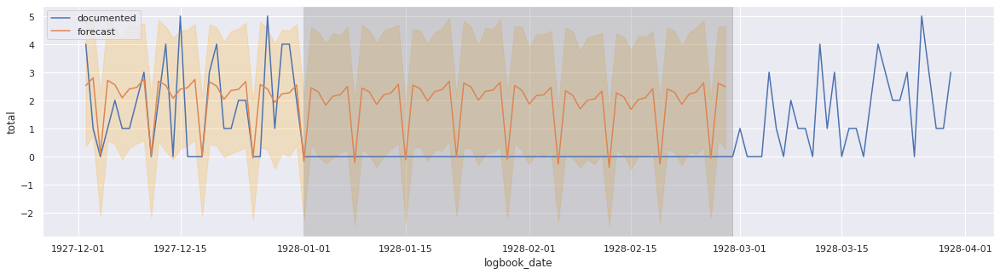

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/pbp9v646.json


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
training on data from 1919-11-17 00:00:00 to 1930-01-02 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/btuliqgx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6859', 'data', 'file=/tmp/tmpr6ojztkn/pbp9v646.json', 'init=/tmp/tmpr6ojztkn/btuliqgx.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modeld6a7ji3k/prophet_model-20230113151443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecasting for 149 days
plotting counts for 1929-12-03 00:00:00 to 1930-07-02 00:00:00


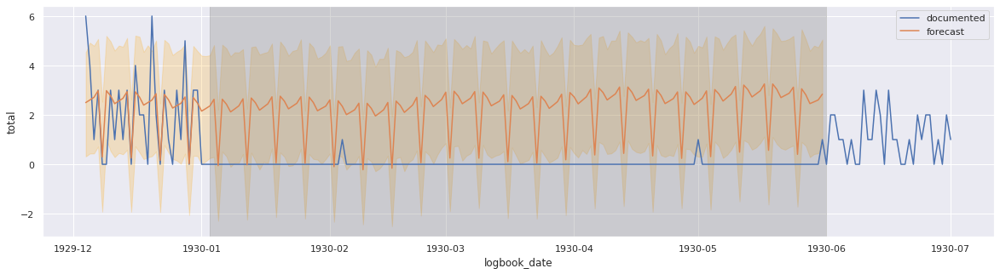

forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
training on data from 1919-11-17 00:00:00 to 1930-07-31 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/apzxvi_b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/4au3xbwi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66771', 'data', 'file=/tmp/tmpr6ojztkn/apzxvi_b.json', 'init=/tmp/tmpr6ojztkn/4au3xbwi.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelev6e3exc/prophet_model-20230113151449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecasting for 152 days
plotting counts for 1930-07-01 00:00:00 to 1931-01-31 00:00:00


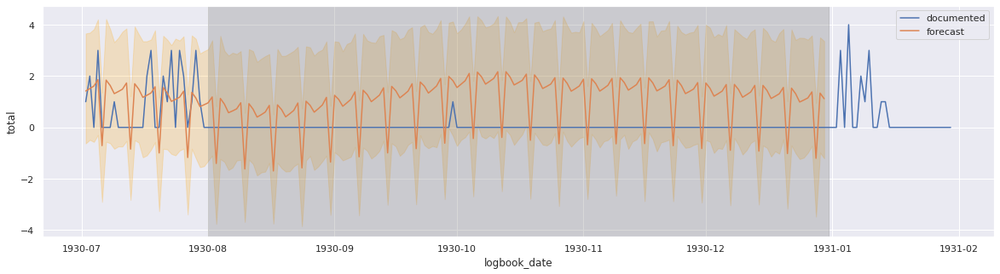

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/vxt73j7b.json


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
training on data from 1919-11-17 00:00:00 to 1931-02-16 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/qxqcyxbv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=766', 'data', 'file=/tmp/tmpr6ojztkn/vxt73j7b.json', 'init=/tmp/tmpr6ojztkn/qxqcyxbv.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model5n49diyh/prophet_model-20230113151455.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:14:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:14:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecasting for 586 days
plotting counts for 1931-01-17 00:00:00 to 1932-10-26 00:00:00


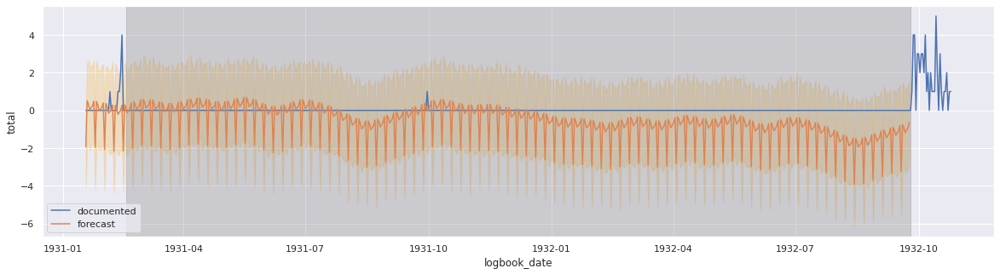

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/lg49tubb.json


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
training on data from 1932-09-27 00:00:00 to 1936-12-31 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/s6zlzl_e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9713', 'data', 'file=/tmp/tmpr6ojztkn/lg49tubb.json', 'init=/tmp/tmpr6ojztkn/s6zlzl_e.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model81damabf/prophet_model-20230113151501.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 411 days, forecasting for 411 days
plotting counts for 1936-12-01 00:00:00 to 1938-03-19 00:00:00


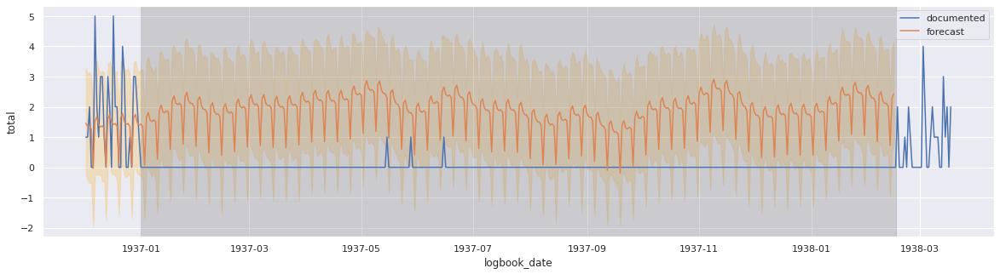

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/0xtsavd9.json


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
training on data from 1932-09-27 00:00:00 to 1938-05-05 00:00:00


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/nrskmppp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96972', 'data', 'file=/tmp/tmpr6ojztkn/0xtsavd9.json', 'init=/tmp/tmpr6ojztkn/nrskmppp.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelvztypkaj/prophet_model-20230113151505.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 167 days, forecasting for 167 days
plotting counts for 1938-04-05 00:00:00 to 1938-11-20 00:00:00


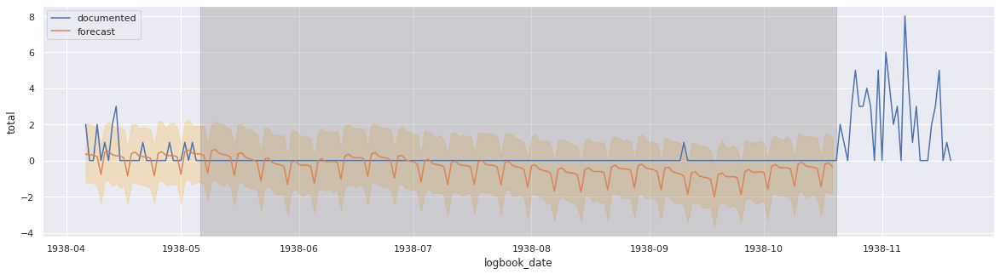

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-17,2.567376,-0.500582,3.937442,2.567376,2.567376,-0.721503,-0.721503,-0.721503,-1.722466,...,0.546182,0.546182,0.546182,0.454781,0.454781,0.454781,0.0,0.0,0.0,1.845873
1,1919-11-18,2.568413,-0.608828,3.963945,2.568413,2.568413,-0.876097,-0.876097,-0.876097,-1.722466,...,0.402094,0.402094,0.402094,0.444275,0.444275,0.444275,0.0,0.0,0.0,1.692316
2,1919-11-19,2.569450,-0.891475,3.379041,2.569450,2.569450,-1.349786,-1.349786,-1.349786,-1.722466,...,-0.058044,-0.058044,-0.058044,0.430724,0.430724,0.430724,0.0,0.0,0.0,1.219663
3,1919-11-20,2.570486,-0.424096,3.627375,2.570486,2.570486,-1.040835,-1.040835,-1.040835,-1.722466,...,0.267245,0.267245,0.267245,0.414386,0.414386,0.414386,0.0,0.0,0.0,1.529652
4,1919-11-21,2.571523,-0.524878,3.535025,2.571523,2.571523,-1.005583,-1.005583,-1.005583,-1.722466,...,0.321292,0.321292,0.321292,0.395590,0.395590,0.395590,0.0,0.0,0.0,1.565940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2209,1938-10-15,1.243814,-2.095882,1.245448,1.188141,1.291495,-1.693017,-1.693017,-1.693017,-1.703070,...,0.010539,0.010539,0.010539,-0.000486,-0.000486,-0.000486,0.0,0.0,0.0,-0.449203
2210,1938-10-16,1.241991,-3.055405,0.172505,1.185872,1.289678,-2.680629,-2.680629,-2.680629,-1.703070,...,-0.971723,-0.971723,-0.971723,-0.005836,-0.005836,-0.005836,0.0,0.0,0.0,-1.438638
2211,1938-10-17,1.240167,-1.754713,1.469443,1.183488,1.288552,-1.442241,-1.442241,-1.442241,-1.703070,...,0.272064,0.272064,0.272064,-0.011235,-0.011235,-0.011235,0.0,0.0,0.0,-0.202074
2212,1938-10-18,1.238343,-1.803980,1.461850,1.181140,1.287521,-1.370332,-1.370332,-1.370332,-1.703070,...,0.348644,0.348644,0.348644,-0.015906,-0.015906,-0.015906,0.0,0.0,0.0,-0.131989


In [32]:

# lists to aggregate forecasts and models
all_daily_forecasts_dfs = []
# all_gap_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  daily_prophet = Prophet(daily_seasonality=True)
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  # preceding_data = logbooks_daily_count[logbooks_daily_count.logbook_date < gap_start]
  preceding_data = logbook_events_nogaps_daily[logbook_events_nogaps_daily.logbook_date < gap_start]
  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.logbook_date >= post1932 ]

  print('training on data from %s to %s' % (preceding_data.logbook_date.min(), preceding_data.logbook_date.max()))

  # drop any zeroes, in case that is skewing how prophet fits over the gaps
  # preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit thed ata
  daily_prophet.fit(preceding_data.rename(columns={'logbook_date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = gap['days']
  print('gap is %s days, forecasting for %d days' % (gap['days'], forecast_for))
  days_future = daily_prophet.make_future_dataframe(periods=forecast_for, freq='D')
  days_fcst = daily_prophet.predict(days_future)

  # plot the forecast around our gap
  # forecast_near_gap = months_fcst[(months_fcst.ds > (gap_start - near_gap)) & (months_fcst.ds < (gap_end + near_gap))]
  # display(forecast_near_gap.head())
  # all_gap_forecasts_dfs.append(forecast_near_gap)

  print('plotting counts for %s to %s' % (gap_start - onemonth, gap_end + onemonth))
  fig, ax = plt.subplots(figsize=(20, 5))
  daily_count_near_gap = logbooks_daily_count[(logbooks_daily_count.logbook_date > (gap_start - onemonth)) & (logbooks_daily_count.logbook_date < (gap_end + onemonth))]

  forecast_near_gap = days_fcst[(days_fcst.ds > (gap_start - onemonth)) & (days_fcst.ds < (gap_end + onemonth))]
  sns.lineplot(data=daily_count_near_gap, x='logbook_date', y='total', label='documented', ax=ax)
  sns.lineplot(data=forecast_near_gap, x='ds', y='yhat', label='forecast', ax=ax)
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.3)
  ax.fill_between(x='ds', y1='yhat_lower', y2='yhat_upper', data=forecast_near_gap, color="orange", alpha=0.2)
  plt.show()

  all_daily_forecasts_dfs.append(days_fcst.copy())

# combine all the forecasts into a single df
daily_logbooks_forecast = pd.concat(all_daily_forecasts_dfs)
# all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

daily_logbooks_forecast


### aggregate estimates

In [33]:

# tally up forecast estimates/upper/lower from daily_logbooks_forecast

daily_missing = 0
daily_missing_upper = 0
daily_missing_lower = 0


daily_estimates = []

for i, gap in enumerate(logbook_gaps): 
  gap_start = gap['start']
  gap_end = gap['end']
  print(gap_start, gap_end)
  print('gap range ')
  gap_range = DateTimeRange(gap_start, gap_end)
  print(gap_range)
  # get documented counts for this time period

  gap_counts = logbooks_daily_count[(logbooks_daily_count.logbook_date >= gap_start) & (logbooks_daily_count.logbook_date <= gap_end)]
  # print(gap_counts)
  # now get the forecast for the same days
  forecast = daily_logbooks_forecast[(daily_logbooks_forecast.ds >= gap_start) & (daily_logbooks_forecast.ds <= gap_end)]
  print(forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

  for forecast_day in forecast.itertuples():
      # missing estimate is the forecast value minus any actual recorded count for this day
      documented_day = logbooks_daily_count[logbooks_daily_count.logbook_date == forecast_day.ds].iloc[0]

      # cap estimates at zero (main and lower both possible to go below)
      daily_missing += max(0, (max(0, forecast_day.yhat) - documented_day.total))
      daily_missing_upper += (forecast_day.yhat_upper - documented_day.total)
      daily_missing_lower += max(0, (max(0, forecast_day.yhat_lower) - documented_day.total))

      # aggregate forecast values so we can output as csv for reference
      daily_estimates.append({
          'date': forecast_day.ds,
          'documented_total': documented_day.total,
          'forecast': forecast_day.yhat,
          'forecast_upper': forecast_day.yhat_upper,
          'forecast_lower': forecast_day.yhat_lower,
          'forecast_range': forecast_day.yhat_upper - forecast_day.yhat_lower,
      })

print('''\n\nmissing estimates:
  %s
  upper: %s
  lower: %s''' % (daily_missing, daily_missing_upper, daily_missing_lower))

1928-01-01 00:00:00 1928-02-29 00:00:00
gap range 
1928-01-01T00:00:00 - 1928-02-29T00:00:00
             ds      yhat  yhat_upper  yhat_lower
2967 1928-01-01 -0.177923    2.106041   -2.247779
2968 1928-01-02  2.450180    4.606069    0.445208
2969 1928-01-03  2.295678    4.435769    0.002522
2970 1928-01-04  1.827777    4.014094   -0.234036
2971 1928-01-05  2.148182    4.390855   -0.048469
1930-01-03 00:00:00 1930-06-01 00:00:00
gap range 
1930-01-03T00:00:00 - 1930-06-01T00:00:00
             ds      yhat  yhat_upper  yhat_lower
3700 1930-01-03  2.362089    4.410838    0.255427
3701 1930-01-04  2.631160    4.823339    0.294023
3702 1930-01-05 -0.055605    2.214652   -2.289412
3703 1930-01-06  2.633905    4.838520    0.514996
3704 1930-01-07  2.432015    4.690651    0.321108
1930-08-01 00:00:00 1930-12-31 00:00:00
gap range 
1930-08-01T00:00:00 - 1930-12-31T00:00:00
             ds      yhat  yhat_upper  yhat_lower
3910 1930-08-01  0.957457    3.045005   -1.303928
3911 1930-08-02  1.18

In [34]:
daily_estimates_df = pd.DataFrame(daily_estimates)
daily_estimates_df.to_csv('logbooks_prophet_missingevent_daily_estimates.csv', index=False)

## aggregate by weekly count

In [35]:
logbooks_weekly_count = logbook_events_df.groupby([pd.Grouper(key='logbook_date', freq='W')])['event_type'].count().reset_index()
logbooks_weekly_count.rename(columns={'event_type': 'total'}, inplace=True)
logbooks_weekly_count

,logbook_date,total
0,1919-11-23,12
1,1919-11-30,12
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1186,1942-08-16,0
1187,1942-08-23,0
1188,1942-08-30,0
1189,1942-09-06,0


In [36]:
logbooks_nogaps_weekly_count = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='W')])['event_type'].count().reset_index()
logbooks_nogaps_weekly_count.rename(columns={'event_type': 'total'}, inplace=True)
logbooks_nogaps_weekly_count

,logbook_date,total
0,1919-11-23,12
1,1919-11-30,12
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1186,1942-08-16,0
1187,1942-08-23,0
1188,1942-08-30,0
1189,1942-09-06,0


### fit model and forecast

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/h6pxze8s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/rsz7fmja.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9258', 'data', 'file=/tmp/tmpr6ojztkn/h6pxze8s.json', 'init=/tmp/tmpr6ojztkn/rsz7fmja.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model6pf61bwq/prophet_model-20230113151511.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


15:15:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 16 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
418,1928-01-01,15.693693,9.867816,20.841950,15.693693,15.693693,-0.457720,-0.457720,-0.457720,-0.457720,-0.457720,-0.457720,0.0,0.0,0.0,15.235974
419,1928-01-08,15.644579,8.893652,20.019295,15.644579,15.644579,-0.836217,-0.836217,-0.836217,-0.836217,-0.836217,-0.836217,0.0,0.0,0.0,14.808363
420,1928-01-15,15.595466,9.526461,20.568260,15.595466,15.595466,-0.461749,-0.461749,-0.461749,-0.461749,-0.461749,-0.461749,0.0,0.0,0.0,15.133717
421,1928-01-22,15.546352,10.090588,21.374503,15.545113,15.546568,0.406355,0.406355,0.406355,0.406355,0.406355,0.406355,0.0,0.0,0.0,15.952706
422,1928-01-29,15.497238,10.325713,21.943195,15.494165,15.498349,0.747628,0.747628,0.747628,0.747628,0.747628,0.747628,0.0,0.0,0.0,16.244866


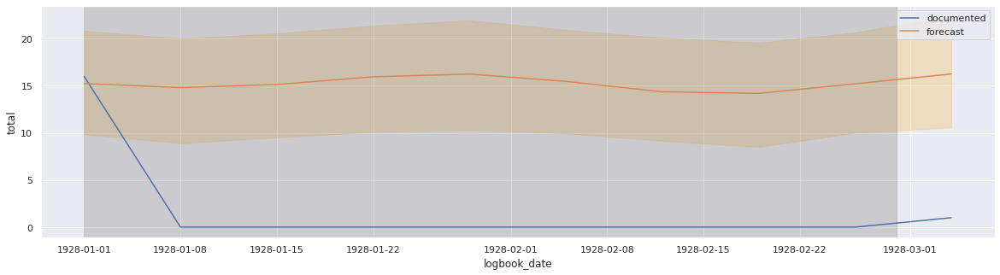

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/ake51i6g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/s70162a1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96443', 'data', 'file=/tmp/tmpr6ojztkn/ake51i6g.json', 'init=/tmp/tmpr6ojztkn/s70162a1.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelh4dq2s3t/prophet_model-20230113151514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}


15:15:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecast for 29 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
514,1929-12-29,15.337819,9.111556,20.844041,15.337819,15.337819,-0.529757,-0.529757,-0.529757,-0.529757,-0.529757,-0.529757,0.0,0.0,0.0,14.808063
515,1930-01-05,15.316567,8.784119,20.442601,15.316567,15.316567,-0.592168,-0.592168,-0.592168,-0.592168,-0.592168,-0.592168,0.0,0.0,0.0,14.724399
516,1930-01-12,15.295314,9.750093,20.641160,15.295314,15.295314,-0.185949,-0.185949,-0.185949,-0.185949,-0.185949,-0.185949,0.0,0.0,0.0,15.109365
517,1930-01-19,15.274062,9.862917,21.632701,15.274062,15.274062,0.468884,0.468884,0.468884,0.468884,0.468884,0.468884,0.0,0.0,0.0,15.742946
518,1930-01-26,15.252809,9.881275,21.970093,15.252809,15.252809,0.723896,0.723896,0.723896,0.723896,0.723896,0.723896,0.0,0.0,0.0,15.976705


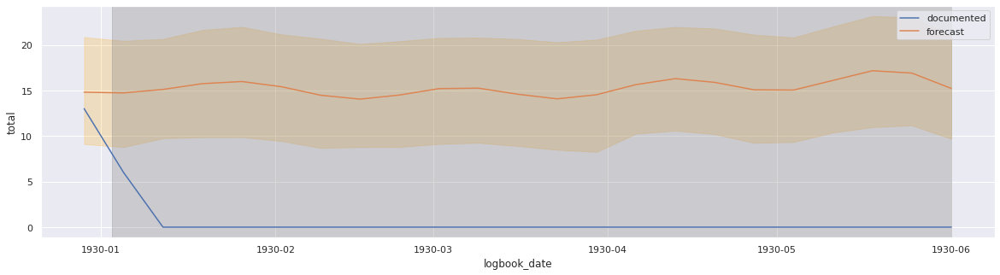

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/wjfv771_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/4cblq2n2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41000', 'data', 'file=/tmp/tmpr6ojztkn/wjfv771_.json', 'init=/tmp/tmpr6ojztkn/4cblq2n2.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelzdcwq39m/prophet_model-20230113151516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}


15:15:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecast for 29 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
523,1930-07-27,13.558004,5.404767,17.396684,13.558004,13.558004,-1.964887,-1.964887,-1.964887,-1.964887,-1.964887,-1.964887,0.0,0.0,0.0,11.593118
524,1930-08-03,13.530469,4.024535,15.834011,13.530469,13.530469,-3.213697,-3.213697,-3.213697,-3.213697,-3.213697,-3.213697,0.0,0.0,0.0,10.316772
525,1930-08-10,13.502933,3.192040,15.060806,13.502933,13.502933,-4.367969,-4.367969,-4.367969,-4.367969,-4.367969,-4.367969,0.0,0.0,0.0,9.134964
526,1930-08-17,13.475398,2.540141,13.928643,13.475398,13.475398,-4.996309,-4.996309,-4.996309,-4.996309,-4.996309,-4.996309,0.0,0.0,0.0,8.479089
527,1930-08-24,13.447862,3.232901,14.825310,13.447862,13.447862,-4.737247,-4.737247,-4.737247,-4.737247,-4.737247,-4.737247,0.0,0.0,0.0,8.710615


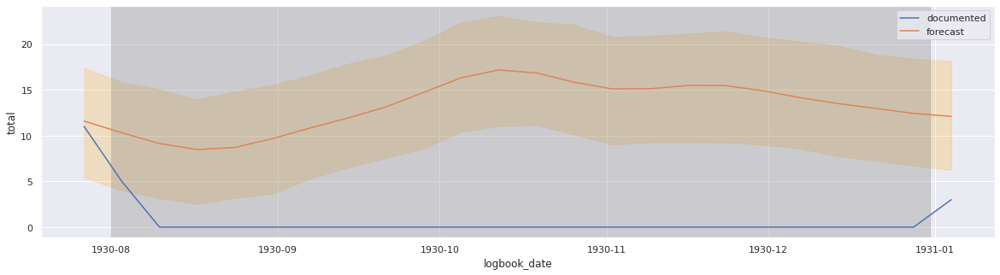

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/d0kmef_4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/ffa0005j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13710', 'data', 'file=/tmp/tmpr6ojztkn/d0kmef_4.json', 'init=/tmp/tmpr6ojztkn/ffa0005j.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelwsldj1p4/prophet_model-20230113151519.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


15:15:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 91 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
529,1931-02-15,11.654442,4.486128,16.142697,11.654442,11.654442,-1.516794,-1.516794,-1.516794,-1.516794,-1.516794,-1.516794,0.0,0.0,0.0,10.137648
530,1931-02-22,11.621194,5.018055,16.685936,11.621194,11.621194,-0.988918,-0.988918,-0.988918,-0.988918,-0.988918,-0.988918,0.0,0.0,0.0,10.632276
531,1931-03-01,11.587946,5.666417,17.316378,11.587946,11.587946,0.049782,0.049782,0.049782,0.049782,0.049782,0.049782,0.0,0.0,0.0,11.637728
532,1931-03-08,11.554698,6.182734,17.833035,11.554698,11.554698,0.425814,0.425814,0.425814,0.425814,0.425814,0.425814,0.0,0.0,0.0,11.980511
533,1931-03-15,11.521450,5.683613,16.974147,11.521450,11.521450,-0.208506,-0.208506,-0.208506,-0.208506,-0.208506,-0.208506,0.0,0.0,0.0,11.312944


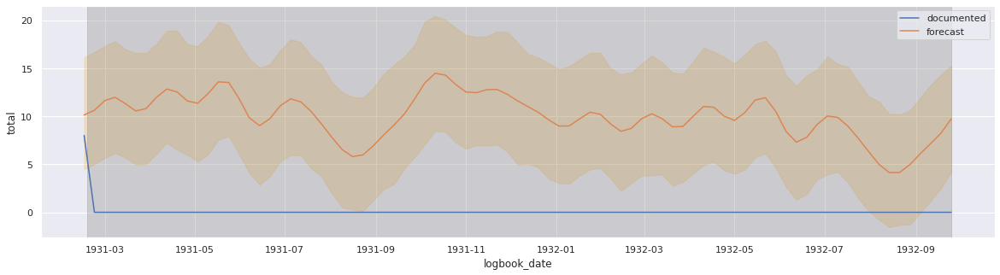

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/5s8_qeut.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/3ffji9ad.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34842', 'data', 'file=/tmp/tmpr6ojztkn/5s8_qeut.json', 'init=/tmp/tmpr6ojztkn/3ffji9ad.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelc268vb1a/prophet_model-20230113151522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}


15:15:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 411 days, forecast for 66 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
201,1936-12-27,10.126235,4.347655,16.119152,10.126235,10.126235,-0.300121,-0.300121,-0.300121,-0.300121,-0.300121,-0.300121,0.0,0.0,0.0,9.826114
202,1937-01-03,10.141426,3.031091,14.789917,10.141426,10.141426,-1.585131,-1.585131,-1.585131,-1.585131,-1.585131,-1.585131,0.0,0.0,0.0,8.556294
203,1937-01-10,10.156616,2.121449,13.997652,10.156448,10.156902,-1.971854,-1.971854,-1.971854,-1.971854,-1.971854,-1.971854,0.0,0.0,0.0,8.184762
204,1937-01-17,10.171807,3.818758,15.256780,10.170791,10.173102,-0.618794,-0.618794,-0.618794,-0.618794,-0.618794,-0.618794,0.0,0.0,0.0,9.553013
205,1937-01-24,10.186998,5.637315,17.729995,10.184853,10.189562,1.197588,1.197588,1.197588,1.197588,1.197588,1.197588,0.0,0.0,0.0,11.384585


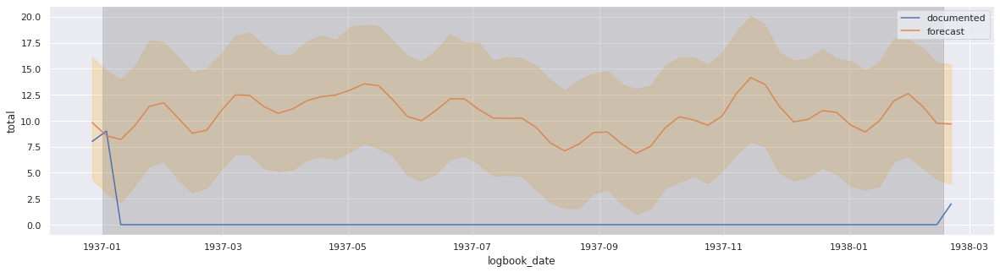

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/aujorv_t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/gasx854h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81967', 'data', 'file=/tmp/tmpr6ojztkn/aujorv_t.json', 'init=/tmp/tmpr6ojztkn/gasx854h.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelyy2w9kr3/prophet_model-20230113151524.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}


15:15:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 167 days, forecast for 31 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
213,1938-05-01,7.670809,2.926949,15.052315,7.670809,7.670809,1.132682,1.132682,1.132682,1.132682,1.132682,1.132682,0.0,0.0,0.0,8.803490
214,1938-05-08,7.664094,4.208861,15.517019,7.664094,7.664094,2.344224,2.344224,2.344224,2.344224,2.344224,2.344224,0.0,0.0,0.0,10.008318
215,1938-05-15,7.657379,4.520035,16.725179,7.657379,7.657379,3.091493,3.091493,3.091493,3.091493,3.091493,3.091493,0.0,0.0,0.0,10.748872
216,1938-05-22,7.650664,4.475439,15.666321,7.650413,7.650735,2.270825,2.270825,2.270825,2.270825,2.270825,2.270825,0.0,0.0,0.0,9.921489
217,1938-05-29,7.643949,2.495448,14.508055,7.642960,7.644628,0.476375,0.476375,0.476375,0.476375,0.476375,0.476375,0.0,0.0,0.0,8.120324


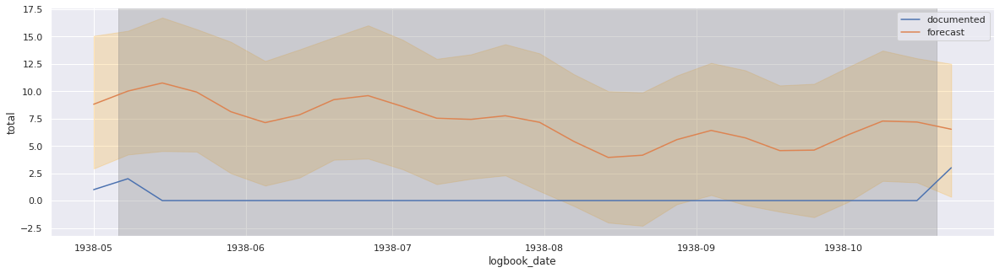

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,6.429522,4.002957,15.050662,6.429522,6.429522,2.982368,2.982368,2.982368,2.982368,2.982368,2.982368,0.0,0.0,0.0,9.411890
1,1919-11-30,6.477097,3.280738,13.913260,6.477097,6.477097,1.978193,1.978193,1.978193,1.978193,1.978193,1.978193,0.0,0.0,0.0,8.455290
2,1919-12-07,6.524672,1.993965,12.909294,6.524672,6.524672,0.870612,0.870612,0.870612,0.870612,0.870612,0.870612,0.0,0.0,0.0,7.395284
3,1919-12-14,6.572248,1.230672,12.537748,6.572248,6.572248,0.355516,0.355516,0.355516,0.355516,0.355516,0.355516,0.0,0.0,0.0,6.927763
4,1919-12-21,6.619823,1.099949,12.176236,6.619823,6.619823,0.221214,0.221214,0.221214,0.221214,0.221214,0.221214,0.0,0.0,0.0,6.841037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,1938-11-06,7.489509,3.049098,14.697817,7.438074,7.539425,1.588634,1.588634,1.588634,1.588634,1.588634,1.588634,0.0,0.0,0.0,9.078143
241,1938-11-13,7.482795,5.169421,16.707991,7.428157,7.536575,3.435000,3.435000,3.435000,3.435000,3.435000,3.435000,0.0,0.0,0.0,10.917795
242,1938-11-20,7.476080,4.912891,16.609113,7.417940,7.533049,3.204551,3.204551,3.204551,3.204551,3.204551,3.204551,0.0,0.0,0.0,10.680631
243,1938-11-27,7.469365,2.828685,14.637904,7.407980,7.530500,1.160193,1.160193,1.160193,1.160193,1.160193,1.160193,0.0,0.0,0.0,8.629558


In [37]:
# show some number of months before/after the gap and forecast
oneweek = timedelta(days=7)

# lists to aggregate forecasts and models
all_weekly_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  weekly_m = Prophet()
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  # preceding_data = logbooks_weekly_count[logbooks_weekly_count.logbook_date < gap_start]
  preceding_data = logbooks_nogaps_weekly_count[logbooks_nogaps_weekly_count.logbook_date < gap_start]

  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.logbook_date >= post1932 ]

  # drop any zeroes, so prophet doesn't fit to missing data
  preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit thed ata
  weekly_m.fit(preceding_data.rename(columns={'logbook_date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = math.ceil(gap['days']/ 7) + 7
  print('gap is %s days, forecast for %d days' % (gap['days'], forecast_for))
  weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')
  weeks_fcst = weekly_m.predict(weeks_future)

  # plot the forecast around our gap
  forecast_near_gap = weeks_fcst[(weeks_fcst.ds > (gap_start - oneweek)) & (weeks_fcst.ds < (gap_end + oneweek))]
  display(forecast_near_gap.head())
  # all_gap_forecasts_dfs.append(forecast_near_gap)

  fig, ax = plt.subplots(figsize=(20, 5))
  # weekly_count_near_gap = logbooks_weekly_count[(logbooks_weekly_count.logbook_date > (gap_start - oneweek)) & (logbooks_weekly_count.logbook_date < (gap_end + oneweek))]
  weekly_count_near_gap = logbooks_nogaps_weekly_count[(logbooks_nogaps_weekly_count.logbook_date > (gap_start - oneweek)) & (logbooks_nogaps_weekly_count.logbook_date < (gap_end + oneweek))]

  forecast_near_gap = weeks_fcst[(weeks_fcst.ds > (gap_start - oneweek)) & (weeks_fcst.ds < (gap_end + oneweek))]
  sns.lineplot(data=weekly_count_near_gap, x='logbook_date', y='total', label='documented', ax=ax)
  sns.lineplot(data=forecast_near_gap, x='ds', y='yhat', label='forecast', ax=ax)
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.3)
  ax.fill_between(x='ds', y1='yhat_lower', y2='yhat_upper', data=forecast_near_gap, color="orange", alpha=0.2)
  plt.show()

  all_weekly_forecasts_dfs.append(weeks_fcst.copy())

# combine all the forecasts into a single df
weekly_logbooks_forecast = pd.concat(all_weekly_forecasts_dfs)
# all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

weekly_logbooks_forecast


### plot weekly model

In [38]:
# plot the forecast against our actual data


def plot_logbooks_weekly_forecast(forecast_df, show_model=False, separate_model_decades=False):
  # use logbook events monthly for known values; use all gaps forecast for predictions
  return plot_forecast(logbooks_nogaps_weekly_count.rename(columns={"logbook_date":"date"}), forecast_df, 
                       forecast_df, show_model=show_model, 
                       separate_model_decades=separate_model_decades)


In [151]:
plot_logbooks_weekly_forecast(weekly_logbooks_forecast)

<ipython-input-149-8e7696927aa5>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [152]:
plot_logbooks_weekly_forecast(weekly_logbooks_forecast, show_model=True)

<ipython-input-149-8e7696927aa5>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [153]:
plot_logbooks_weekly_forecast(weekly_logbooks_forecast, show_model=True, separate_model_decades=True)

<ipython-input-149-8e7696927aa5>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_pre1932['label'] = "forecast model - 1920s"
<ipython-input-149-8e7696927aa5>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_post1932["label"] = "forecast model - 1930s"
<ipython-input-149-8e7696927aa5>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

alt.LayerChart(...)

### aggregate estimates

In [42]:

onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)

weekly_missing = 0
weekly_missing_upper = 0
weekly_missing_lower = 0

weekly_estimates = []

for i, gap in enumerate(logbook_gaps): 
  gap_start = gap['start']
  gap_end = gap['end']
  print(gap_start, gap_end)
  print('gap range ')
  gap_range = DateTimeRange(gap_start, gap_end)
  print(gap_range)
  # get documented counts for this time period


  gap_counts = logbooks_nogaps_weekly_count[(logbooks_nogaps_weekly_count.logbook_date >= gap_start) & (logbooks_nogaps_weekly_count.logbook_date <= gap_end + oneweek)]
  print(gap_counts.head())
  # now get the forecast for the same weeks
  weekly_forecast = weekly_logbooks_forecast[(weekly_logbooks_forecast.ds >= gap_start) & (weekly_logbooks_forecast.ds <= gap_end + oneweek)]
  print(weekly_forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

  for week in gap_counts.itertuples():
    week_start = week.logbook_date 
    print(week_start)

    # do logbook weeks and forecast weeks match?
    # missing estimate is the forecast value minus any actual recorded count for this day
    documented_week = logbooks_weekly_count[logbooks_weekly_count.logbook_date == forecast_day.ds]  #.iloc[0]
    # seems possible there's no documented week
    if documented_week.shape[0]:
      documented_week = documented_week.iloc[0]
    else: 
      documented_week = None

    # check if the padding put us past the end of the current gap
    if week_start > gap_end:
      continue

    # get the end of the same month (first of the next month minus one day)
    week_end = week_start + oneweek
    # how many days from this month overlap with our gap?
    gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
    overlap_days = gap_intersection.timedelta.days
    print('gap overlap for %s is %d days' % (week_end, overlap_days))
    # what is our threshold for using the forecast value instead of recorded? 
    # let's try 3 days
    if overlap_days > 3:
      week_total = 0
      if documented_week:
        week_total = week.total

      # get the forecast value for this week
      week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
      # missing estimate is the forecast value minus any actual recorded count for this month
      weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
      weekly_missing_upper += (week_forecast.yhat_upper - week_total)
      # cap lower estimate at zero
      weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

      # aggregate forecast values so we can output as csv for reference
      weekly_estimates.append({
          'date': month_end,
          'documented_total': week_total,
          'gap_days': overlap_days,
          'forecast': week_forecast.yhat,
          'forecast_upper': week_forecast.yhat_upper,
          'forecast_lower': week_forecast.yhat_lower,
          'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
      })

print('''\n\nmissing estimates:
  %s
  upper: %s
  lower: %s''' % (weekly_missing, weekly_missing_upper, weekly_missing_lower))

1928-01-01 00:00:00 1928-02-29 00:00:00
gap range 
1928-01-01T00:00:00 - 1928-02-29T00:00:00
    logbook_date  total
423   1928-01-01     16
424   1928-01-08      0
425   1928-01-15      0
426   1928-01-22      0
427   1928-01-29      0
            ds       yhat  yhat_upper  yhat_lower
418 1928-01-01  15.235974   20.841950    9.867816
419 1928-01-08  14.808363   20.019295    8.893652
420 1928-01-15  15.133717   20.568260    9.526461
421 1928-01-22  15.952706   21.374503   10.090588
422 1928-01-29  16.244866   21.943195   10.325713
1928-01-01 00:00:00
gap overlap for 1928-01-08 00:00:00 is 7 days
1928-01-08 00:00:00
gap overlap for 1928-01-15 00:00:00 is 7 days
1928-01-15 00:00:00
gap overlap for 1928-01-22 00:00:00 is 7 days
1928-01-22 00:00:00
gap overlap for 1928-01-29 00:00:00 is 7 days
1928-01-29 00:00:00
gap overlap for 1928-02-05 00:00:00 is 7 days
1928-02-05 00:00:00
gap overlap for 1928-02-12 00:00:00 is 7 days
1928-02-12 00:00:00
gap overlap for 1928-02-19 00:00:00 is 7 days
1

### summarize

In [43]:
# total recorded events from logbooks

def summarize_weekly_estimate():
  logbook_total = logbooks_weekly_count.total.sum()

  # membership events from outside the logbooks (largely addressbooks)
  nonlogbook_total = nonlogbook_membership_events.shape[0]

  actual_total = membership_events.shape[0]

  # estimated totals
  est_total = round(logbook_total + weekly_missing)
  upper_est_total = round(logbook_total + weekly_missing_upper)
  lower_est_total = round(logbook_total + missing_lower)

  # logbook percentages
  pct_survived = logbook_total / est_total * 100
  upper_pct_survived = logbook_total / upper_est_total  * 100
  lower_pct_survived = logbook_total / lower_est_total * 100

  # actual/total percentages
  all_pct_survived = actual_total / est_total * 100
  all_upper_pct_survived = actual_total / upper_est_total  * 100
  all_lower_pct_survived = actual_total / lower_est_total * 100

  print(f"total events from logbooks: {logbook_total:,}")
  print(f"total membership events from any source: {actual_total:,} ({nonlogbook_total:,} non-logbook membership events)")


  print(f"""
  logbook percentages:
  undocumented events: {round(weekly_missing):,} (upper {round(weekly_missing_upper):,}, lower {round(weekly_missing_lower):,})
  total estimate : {est_total:,} (upper {upper_est_total:,}, lower {lower_est_total:,}) 
  % survived:  {pct_survived:.2f}% (upper estimate: {upper_pct_survived:.2f}%, lower estimate: {lower_pct_survived:.2f}%) 

  total percentages:
  % survived: {all_pct_survived:.2f}% (upper estimate: {all_upper_pct_survived:.2f}%, lower estimate: {all_lower_pct_survived:.2f}%) 
  """)
  
summarize_weekly_estimate()

total events from logbooks: 11,601
total membership events from any source: 13,039 (1,438 non-logbook membership events)

  logbook percentages:
  undocumented events: 2,335 (upper 3,602, lower 1,096)
  total estimate : 13,936 (upper 15,203, lower 12,350) 
  % survived:  83.24% (upper estimate: 76.31%, lower estimate: 93.94%) 

  total percentages:
  % survived: 93.56% (upper estimate: 85.77%, lower estimate: 105.58%) 
  


In [44]:
weekly_estimates_df = pd.DataFrame(weekly_estimates)
weekly_estimates_df.to_csv('logbooks_prophet_missingevent_weekly_estimates.csv', index=False)

## prophet cross validation

### weekly

In [45]:
# use logbooks_nogaps_weekly_count

from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric



# use data up to first logbook gap, which starts December 31 1927
first_chunk = logbooks_nogaps_weekly_count[logbooks_nogaps_weekly_count.logbook_date < pd.to_datetime(date(1928, 1, 1))]
cv_week_prophet = Prophet()
# rename columns for prophet and fit
cv_week_prophet.fit(first_chunk.rename(columns={'logbook_date': 'ds', 'total': 'y'}))


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/f7os9rnw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/w3vy2fs2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55322', 'data', 'file=/tmp/tmpr6ojztkn/f7os9rnw.json', 'init=/tmp/tmpr6ojztkn/w3vy2fs2.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelhzfestca/prophet_model-20230113151535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [46]:
# try predicting for a horizon of a year, with an initial training set of three years
df_cv = cross_validation(cv_week_prophet, initial='1095 days', horizon='365 days') # initial='36 months', period='180 days', horizon = '365 days')
df_cv

INFO:prophet:Making 9 forecasts with cutoffs between 1922-12-26 00:00:00 and 1926-12-25 00:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/n_vf22jr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/8i225e97.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24979', 'data', 'file=/tmp/tmpr6ojztkn/n_vf22jr.json', 'init=/tmp/tmpr6ojztkn/8i225e97.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelztktyj2m/prophet_model-20230113151535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/adkiks3r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/r85gau1p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1922-12-31,19.235261,15.333828,23.527696,7,1922-12-26
1,1923-01-07,17.810299,13.554844,21.956258,8,1922-12-26
2,1923-01-14,15.235970,11.216728,19.277277,14,1922-12-26
3,1923-01-21,13.781044,9.616550,17.571462,21,1922-12-26
4,1923-01-28,14.703884,10.569071,18.811370,15,1922-12-26
...,...,...,...,...,...,...
464,1927-11-27,28.355562,22.979657,33.377779,11,1926-12-25
465,1927-12-04,27.227289,21.882589,32.412787,18,1926-12-25
466,1927-12-11,26.522851,21.602638,31.943763,10,1926-12-25
467,1927-12-18,26.564168,21.285708,31.781915,11,1926-12-25


In [47]:
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 00:00:00,47.295969,6.877206,5.526598,0.445729,0.242940,0.323381,0.478261
1,36 days 12:00:00,46.133090,6.792134,5.461265,0.435762,0.242940,0.318814,0.478261
2,37 days 00:00:00,46.035441,6.784942,5.417732,0.434029,0.242940,0.317000,0.478261
3,37 days 12:00:00,45.962883,6.779593,5.402738,0.434246,0.242940,0.317188,0.478261
4,38 days 00:00:00,44.753655,6.689817,5.259001,0.423471,0.220013,0.308899,0.500000


/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


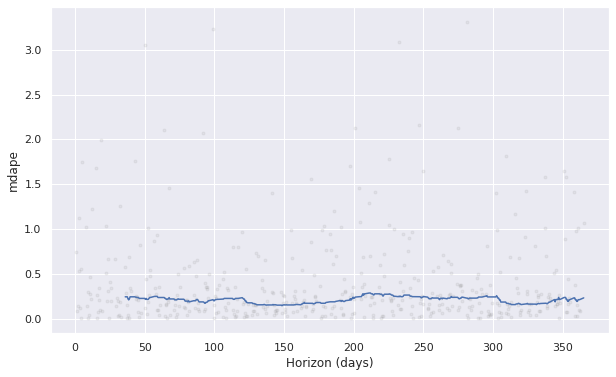

In [48]:

fig = plot_cross_validation_metric(df_cv, metric='mdape')

/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


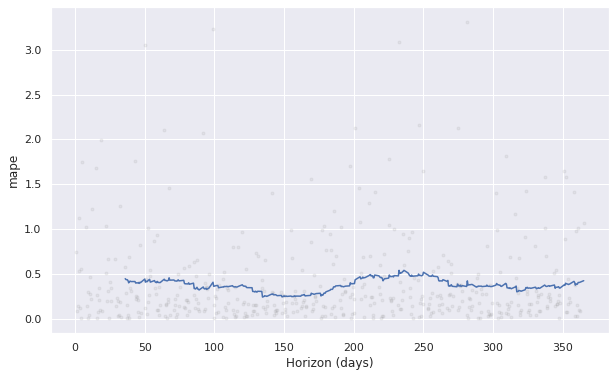

In [49]:
fig = plot_cross_validation_metric(df_cv, metric='mape')

/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


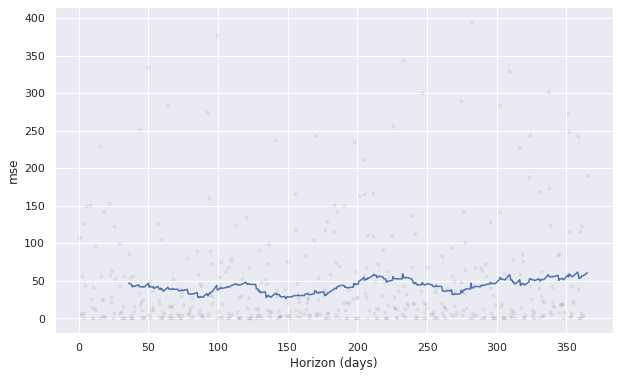

In [50]:
fig = plot_cross_validation_metric(df_cv, metric='mse')

### daily 

In [51]:
logbooks_daily_count = logbook_events_df.groupby([pd.Grouper(key='logbook_date', freq='D')])['event_type'].count().reset_index()
logbooks_daily_count.rename(columns={'event_type': 'total'}, inplace=True)
logbooks_daily_count

,logbook_date,total
0,1919-11-17,3
1,1919-11-18,4
2,1919-11-19,1
3,1919-11-20,1
4,1919-11-21,2
...,...,...
8326,1942-09-03,0
8327,1942-09-04,0
8328,1942-09-05,0
8329,1942-09-06,0


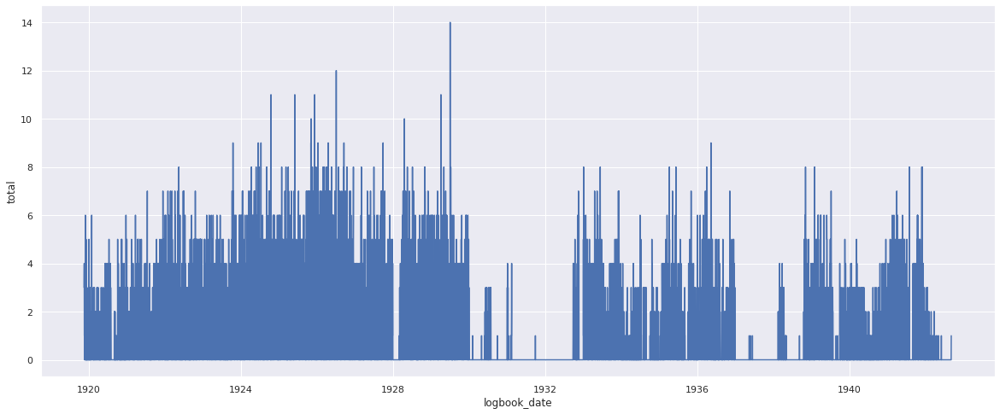

In [52]:
import seaborn as sns

sns.set(rc = {'figure.figsize':(20, 8)})
sns.lineplot(data=logbooks_daily_count, x='logbook_date', y='total')

In [53]:
from prophet.diagnostics import cross_validation


# use data up to first logbook gap, which starts December 31 1927
first_chunk = logbooks_daily_count[logbooks_daily_count.logbook_date < pd.to_datetime(date(1928, 1, 1))]
daily_prophet = Prophet(daily_seasonality=True)
# rename columns for prophet and fit
daily_prophet.fit(first_chunk.rename(columns={'logbook_date': 'ds', 'total': 'y'}))


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/pp54sxy4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/hucyla2d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22484', 'data', 'file=/tmp/tmpr6ojztkn/pp54sxy4.json', 'init=/tmp/tmpr6ojztkn/hucyla2d.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelc3in887a/prophet_model-20230113151547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [54]:
# try predicting for a horizon of a year, with an initial training set of three years
df_cv = cross_validation(daily_prophet, initial='1095 days', horizon='365 days') # initial='36 months', period='180 days', horizon = '365 days')
df_cv

INFO:prophet:Making 9 forecasts with cutoffs between 1923-01-01 00:00:00 and 1926-12-31 00:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/aos49bqt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/_16r5jdq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57468', 'data', 'file=/tmp/tmpr6ojztkn/aos49bqt.json', 'init=/tmp/tmpr6ojztkn/_16r5jdq.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model9dppycrz/prophet_model-20230113151548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:15:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:15:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/u9sfjmsm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/wui9czvb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1923-01-02,2.690710,0.976177,4.384715,3,1923-01-01
1,1923-01-03,1.975878,0.274140,3.844668,3,1923-01-01
2,1923-01-04,2.652223,0.897052,4.458466,1,1923-01-01
3,1923-01-05,2.591351,0.822362,4.381238,0,1923-01-01
4,1923-01-06,2.517673,0.792363,4.438117,1,1923-01-01
...,...,...,...,...,...,...
3280,1927-12-27,3.942460,1.787504,6.205798,5,1926-12-31
3281,1927-12-28,3.464839,1.410065,5.606280,1,1926-12-31
3282,1927-12-29,3.812891,1.541446,6.005545,4,1926-12-31
3283,1927-12-30,3.917010,1.932576,6.111742,4,1926-12-31


In [55]:
from prophet.diagnostics import performance_metrics

df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,36 days 12:00:00,3.467769,1.862195,1.478149,0.505227,0.822318,0.701220
1,37 days 00:00:00,3.443192,1.855584,1.471442,0.494660,0.821257,0.703659
2,37 days 12:00:00,3.362247,1.833643,1.450289,0.494660,0.814163,0.713415
3,38 days 00:00:00,3.350352,1.830397,1.443141,0.494660,0.815606,0.717073
4,38 days 12:00:00,3.339933,1.827548,1.439392,0.499970,0.822481,0.719512


/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


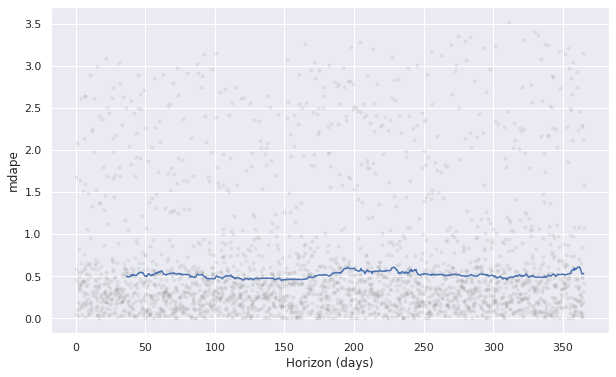

In [56]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='mdape')

/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


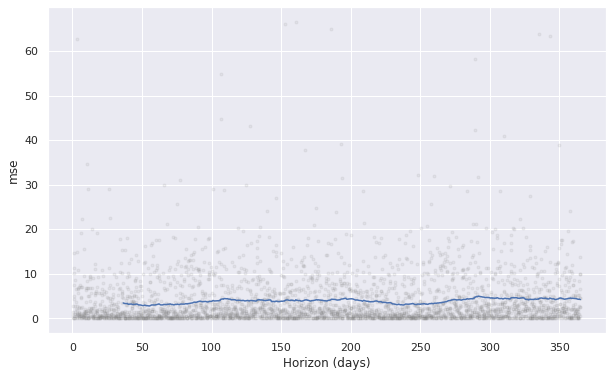

In [57]:
fig = plot_cross_validation_metric(df_cv, metric='mse')

/usr/local/lib/python3.8/dist-packages/prophet/plot.py:544: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])
/usr/local/lib/python3.8/dist-packages/prophet/plot.py:545: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').astype(np.int64) / float(dt_conversions[i])


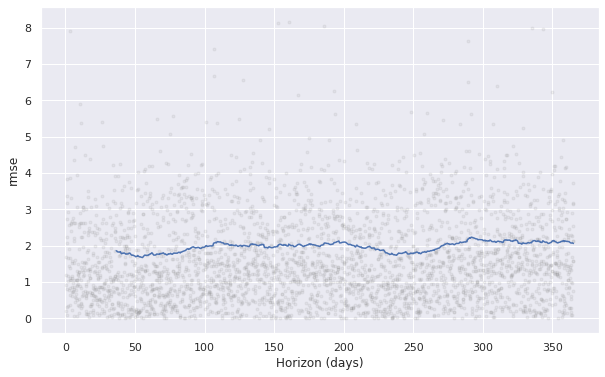

In [58]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

# missing members

how are new members added over time?

## member data setup

### generate short member id for readability

In [59]:
# split multiple members for shared accounts in events
events_df[
    ["first_member_uri", "second_member_uri"]
] = events_df.member_uris.str.split(";", expand=True)

# working with the first member for now...
# generate short ids equivalent to those in member and book dataframes
events_df["member_id"] = events_df.first_member_uri.apply(
    lambda x: x.split("/")[-2]
)
events_df["item_id"] = events_df.item_uri.apply(
    lambda x: x.split("/")[-2] if pd.notna(x) else None
)

### member dates

In [60]:
# looking at all the data, what is the first event for each member?
member_dates = events_df.copy()

# make sure each event has an earliest known date
def earliest_date(row):
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)     

member_dates['earliest_date'] = member_dates.apply(earliest_date, axis=1)
member_dates[['event_type', 'member_id', 'earliest_date', 'start_date', 'end_date' ,'subscription_purchase_date', 'source_type']]

,event_type,member_id,earliest_date,start_date,end_date,subscription_purchase_date,source_type
0,Generic,linossier-raymonde,1920,1920,NaN,NaN,Lending Library Card
1,Subscription,garreta,1921,1921,NaN,1921,Address Book
2,Borrow,rhys,1922,1922,1922-08-23,NaN,Lending Library Card
3,Generic,walsh,1922,1922,NaN,NaN,Lending Library Card
4,Subscription,lincoln-1,1922,1922,NaN,1922,Address Book
...,...,...,...,...,...,...,...
35518,Reimbursement,gutmann-henri,None,NaN,NaN,NaN,Address Book
35519,Generic,bernheim-antoinette,None,NaN,NaN,NaN,Lending Library Card
35520,Reimbursement,baldwin-mr,None,NaN,NaN,NaN,Address Book
35521,Generic,bernheim-antoinette,None,NaN,NaN,NaN,Lending Library Card


In [61]:
# convert earliest date to datetime; convert partially known dates to -01-01  for now
member_dates['date'] = pd.to_datetime(member_dates['earliest_date'], errors='coerce')
member_dates[['event_type', 'member_id', 'date', 'start_date', 'end_date' ,'subscription_purchase_date', 'source_type']]

,event_type,member_id,date,start_date,end_date,subscription_purchase_date,source_type
0,Generic,linossier-raymonde,1920-01-01,1920,NaN,NaN,Lending Library Card
1,Subscription,garreta,1921-01-01,1921,NaN,1921,Address Book
2,Borrow,rhys,1922-01-01,1922,1922-08-23,NaN,Lending Library Card
3,Generic,walsh,1922-01-01,1922,NaN,NaN,Lending Library Card
4,Subscription,lincoln-1,1922-01-01,1922,NaN,1922,Address Book
...,...,...,...,...,...,...,...
35518,Reimbursement,gutmann-henri,NaT,NaN,NaN,NaN,Address Book
35519,Generic,bernheim-antoinette,NaT,NaN,NaN,NaN,Lending Library Card
35520,Reimbursement,baldwin-mr,NaT,NaN,NaN,NaN,Address Book
35521,Generic,bernheim-antoinette,NaT,NaN,NaN,NaN,Lending Library Card


In [62]:
# limit to the fields we want, drop unknown dates
members_added = member_dates[['event_type', 'member_id', 'date', 'source_type']].dropna(subset=['date'])
members_added

,event_type,member_id,date,source_type
0,Generic,linossier-raymonde,1920-01-01,Lending Library Card
1,Subscription,garreta,1921-01-01,Address Book
2,Borrow,rhys,1922-01-01,Lending Library Card
3,Generic,walsh,1922-01-01,Lending Library Card
4,Subscription,lincoln-1,1922-01-01,Address Book
...,...,...,...,...
35135,Generic,massey,1961-05-15,Lending Library Card
35136,Crossed out,massey,1961-05-15,Lending Library Card
35137,Generic,massey,1961-05-15,Lending Library Card
35138,Generic,massey,1961-05-15,Lending Library Card


In [63]:
# limit to official time period
from datetime import datetime

members_added = members_added[members_added['date'] < datetime(1942, 1, 1)]

In [64]:
# limit to member uri and date; then group by member and get the first date
members_grouped = members_added[["member_id", "date"]].groupby("member_id")
members_first_dates = members_grouped.first().reset_index()

# members_added = members_added[['member_id', 'date']].drop_duplicates()
# members_added.sort_values('member_id')
members_first_dates.sort_values("date")

,member_id,date
725,cahun,1919-11-17
1599,flot-marcelle,1919-11-17
3879,regnier,1919-11-18
4680,ulmann,1919-11-18
2490,keller-m,1919-11-18
...,...,...
2607,lacorne,1941-12-05
160,azgema,1941-12-06
2573,kohlberg-8,1941-12-09
1827,godard,1941-12-09


## new members by year

### total new members by year (based on member first known event, any source)

In [65]:
newmember_yearly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_yearly_count.rename(columns={'member_id': 'total'}, inplace=True)
newmember_yearly_count

,date,total
0,1919-12-31,40
1,1920-12-31,187
2,1921-12-31,265
3,1922-12-31,332
4,1923-12-31,286
5,1924-12-31,339
6,1925-12-31,411
7,1926-12-31,449
8,1927-12-31,335
9,1928-12-31,306


<Figure size 1440x576 with 0 Axes>

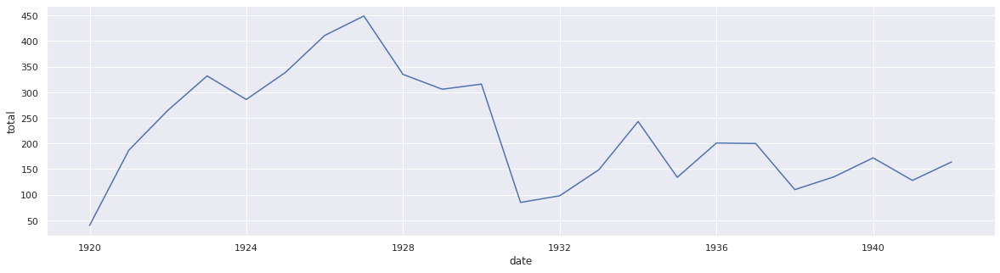

In [66]:
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=newmember_yearly_count, x='date', y='total')

<Figure size 1440x576 with 0 Axes>

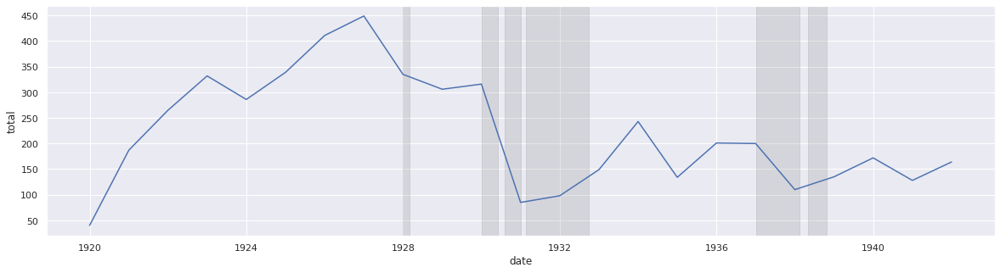

In [67]:

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_yearly_count, x='date', y='total')
for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

In [68]:
## todo: can we graph new members by source? or separate out totals for members not documented in the logbooks? 
# — the latter should be easier: identify members with NO known logbook-sourced events; what source are they from, and when are they first active?


In [69]:
members_added.event_type.value_counts()

Borrow                     20576
Subscription                4832
Renewal                     4799
Reimbursement               2794
Purchase                     801
Crossed out                  267
Supplement                   190
Generic                      131
Separate Payment              85
Request                       26
Gift                          21
Periodical Subscription       16
Name: event_type, dtype: int64

In [70]:
# group again but report on source and event type;
# customize sorting to order so subscriptions will show up first
from pandas.api.types import CategoricalDtype

# main order we care about is subscription first; other order matters less; reimbursement would be expected last
event_type = CategoricalDtype(categories=["Subscription", "Renewal", "Separate Payment", "Borrow", "Purchase", "Supplement", "Request", "Gift", "Crossed out", "Reimbursement"], ordered=True)
# copy member data frame, and convert event type to our new categorical type
member_events = members_added.copy()

member_events['event_type'] = member_events.event_type.astype(event_type)

# sort by date, then sort by event type so if there are any same-day events,
# subscription should always be first
member_events = member_events.sort_values(by=['date', 'event_type'])

members_first_events = member_events.groupby("member_id").first().reset_index()

members_first_events
# members_added = members_added[['member_id', 'date']].drop_duplicates()
# members_added.sort_values('member_id')
# members_first_dates.sort_values("date")

,member_id,event_type,date,source_type
0,Cahn-1,Subscription,1919-12-27,Logbook
1,Clauebou-1,Subscription,1941-11-26,Logbook
2,Edward,Renewal,1941-01-22,Logbook
3,Tyson,Reimbursement,1938-03-15,Logbook
4,abbott,Subscription,1925-04-21,Logbook;Address Book
...,...,...,...,...
5080,zimmer,Subscription,1920-01-16,Logbook;Lending Library Card
5081,zogheb,Borrow,1940-01-05,Lending Library Card
5082,zongenth,Subscription,1926-11-03,Logbook
5083,zueblin,Subscription,1922-10-18,Logbook


In [71]:
# confirm the number of rows in the df == the number of unique members included
len(members_first_events.member_id.unique())

5085

In [72]:
# what is the breakdown of event types for first events?
members_first_events.event_type.value_counts()

Subscription        4189
Renewal              550
Reimbursement        208
Borrow                91
Purchase              18
Separate Payment      12
Supplement            10
Gift                   3
Crossed out            1
Request                0
Name: event_type, dtype: int64

In [73]:
# what about source of first events
members_first_events.source_type.value_counts()

Logbook                                      2744
Logbook;Address Book                         1375
Address Book                                  445
Logbook;Lending Library Card                  242
Lending Library Card                          220
Lending Library Card;Address Book              22
Logbook;Lending Library Card;Address Book      19
Lending Library Card;Logbook                   15
Lending Library Card;Lending Library Card       2
Lending Library Card;Logbook;Address Book       1
Name: source_type, dtype: int64

In [74]:
# next steps: ideal scenario should be, subscription is the first event for a new member
# - what if we model new/first subscriptions over time? 
# that would be the ideal/expected first event for a new member opening an account, and allows us to scope to logbooks.

# test: what is the first membership event type for each member? we would expect it to be a subscription


### new members added, logbook events only

In [75]:
# get first events for each member from logbooks only

# go back to member events, limit to logbook events, then group and get first event
logbook_first_events = member_events[member_events.source_type.str.contains('Logbook')].groupby("member_id").first().reset_index()
logbook_first_events

,member_id,event_type,date,source_type
0,Cahn-1,Subscription,1919-12-27,Logbook
1,Clauebou-1,Subscription,1941-11-26,Logbook
2,Edward,Renewal,1941-01-22,Logbook
3,Tyson,Reimbursement,1938-03-15,Logbook
4,abbott,Subscription,1925-04-21,Logbook;Address Book
...,...,...,...,...
4592,zimmer,Subscription,1920-01-16,Logbook;Lending Library Card
4593,zogheb,Subscription,1940-01-31,Logbook;Lending Library Card
4594,zongenth,Subscription,1926-11-03,Logbook
4595,zueblin,Subscription,1922-10-18,Logbook


In [76]:
# confirm one row per member
len(logbook_first_events.member_id.unique())

4597

In [77]:
# check source type breakdown
logbook_first_events.source_type.value_counts()

Logbook                                              2828
Logbook;Address Book                                 1412
Logbook;Lending Library Card                          309
Logbook;Lending Library Card;Address Book              25
Lending Library Card;Logbook                           20
Logbook;Lending Library Card;Lending Library Card       1
Logbook;Address Book;Lending Library Card               1
Lending Library Card;Logbook;Address Book               1
Name: source_type, dtype: int64

In [78]:
# get new member yearly count for logbook-sourced events only 
logbook_newmembers_by_year = logbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
logbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
logbook_newmembers_by_year

,date,total
0,1919-12-31,53
1,1920-12-31,193
2,1921-12-31,278
3,1922-12-31,322
4,1923-12-31,280
5,1924-12-31,325
6,1925-12-31,404
7,1926-12-31,436
8,1927-12-31,296
9,1928-12-31,289


<Figure size 1440x576 with 0 Axes>

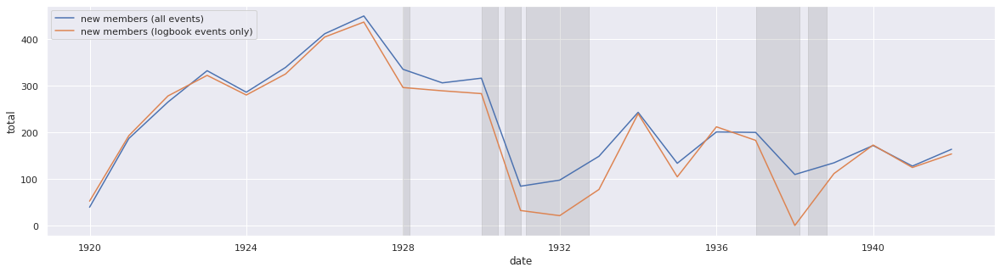

In [79]:
# plot logbook new members with total new members

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

### members only documented in the address books

In [80]:
# what about members we _only_ know about from the address books?

# any member with at least one event in the logbooks
logbook_members = member_events[member_events.source_type.str.contains('Logbook')].member_id.unique()
# any member with at least one event on a card
lending_card_members = member_events[member_events.source_type.str.contains('Lending Library Card')].member_id.unique()
# any member with at least one event from an address book
addressbook_members = member_events[member_events.source_type.str.contains('Address Book')].member_id.unique()

# get a list of address-book-only members 
address_book_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(lending_card_members)
print('%d members who only have events from the address books' % len(address_book_only_members))


329 members who only have events from the address books


In [81]:
# check logic
member_events[member_events.member_id.isin(address_book_only_members)]

,event_type,member_id,date,source_type
216,Subscription,boue-l,1920-03-01,Address Book
224,Subscription,dunlap-sheila,1920-10-01,Address Book
228,Subscription,grant-mrs-robert,1921-01-01,Address Book
233,Subscription,madam-g-s,1921-07-01,Address Book
4,Subscription,lincoln-1,1922-01-01,Address Book
...,...,...,...,...
20967,Subscription,stavis-barrie,1937-07-03,Address Book
20997,Subscription,baumel-germaine,1937-07-07,Address Book
21000,Subscription,ruellan-severine,1937-07-08,Address Book
21001,Subscription,matthews-sylvia,1937-07-08,Address Book


In [82]:
# get date added for address-only members

addressbook_first_events = member_events[member_events.member_id.isin(address_book_only_members)].groupby("member_id").first().reset_index()
addressbook_first_events

,member_id,event_type,date,source_type
0,abbott-berenice,Subscription,1926-09-01,Address Book
1,abrahams,Subscription,1937-06-29,Address Book
2,abrami,Subscription,1937-02-05,Address Book
3,agard-walter,Subscription,1932-01-01,Address Book
4,aguilar-anina-de,Subscription,1931-01-01,Address Book
...,...,...,...,...
324,venturi-franco,Subscription,1937-01-12,Address Book
325,wallace-michael,Subscription,1937-04-02,Address Book
326,wicks,Subscription,1937-04-08,Address Book
327,young-g,Subscription,1937-05-10,Address Book


In [83]:
# get new member yearly count for addressbook-only members events only 
addressbook_newmembers_by_year = addressbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
addressbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
addressbook_newmembers_by_year

,date,total
0,1920-12-31,2
1,1921-12-31,2
2,1922-12-31,9
3,1923-12-31,8
4,1924-12-31,8
5,1925-12-31,7
6,1926-12-31,13
7,1927-12-31,17
8,1928-12-31,16
9,1929-12-31,18


In [84]:
addressbook_newmembers_by_year.total.sum()

329

<Figure size 1440x576 with 0 Axes>

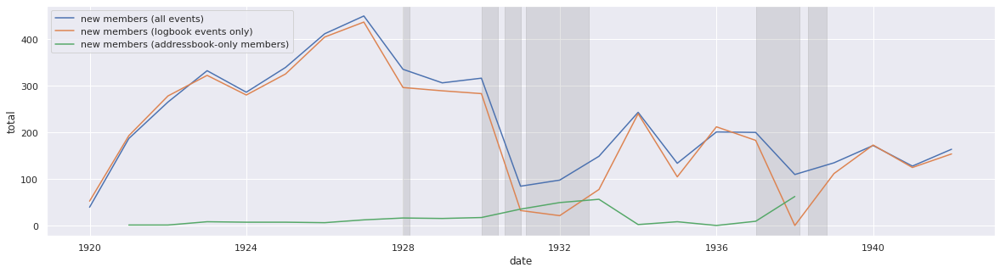

In [85]:
# plot all three sets of new members together

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (addressbook-only members)')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

### members only documented on lending library cards

In [86]:
# do we have any lending-card only members?

# get a list of address-book-only members 
lending_card_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(addressbook_members)
print('%d members who only have events from lending library cards' % len(lending_card_only_members))


124 members who only have events from lending library cards


In [87]:
# check logic
member_events[member_events.member_id.isin(lending_card_only_members)]

,event_type,member_id,date,source_type
705,Borrow,winger,1919-12-02,Lending Library Card
706,Borrow,winger,1919-12-02,Lending Library Card
751,Borrow,winger,1920-01-05,Lending Library Card
752,Borrow,winger,1920-01-05,Lending Library Card
774,Borrow,winger,1920-01-16,Lending Library Card
...,...,...,...,...
29423,Borrow,woodward-daphne,1941-12-08,Lending Library Card
29445,Borrow,valery-francois,1941-12-12,Lending Library Card
29451,Borrow,valery-francois,1941-12-12,Lending Library Card
29459,Borrow,valery-francois,1941-12-12,Lending Library Card


In [88]:
cardonly_members = member_events[member_events.member_id.isin(lending_card_only_members)]
cardonly_members['year'] = cardonly_members.date.apply(lambda x: x.year)
cardonly_members.year.unique()

<ipython-input-88-f0c0ab9987a1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cardonly_members['year'] = cardonly_members.date.apply(lambda x: x.year)


array([1919, 1920, 1922, 1923, 1924, 1925, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941])

In [89]:
# card-only member first events
cardonly_first_events = member_events[member_events.member_id.isin(lending_card_only_members)].groupby("member_id").first().reset_index()
cardonly_first_events

,member_id,event_type,date,source_type
0,beach-family,Gift,1930-12-01,Lending Library Card
1,benjamin-walter,Borrow,1940-02-23,Lending Library Card
2,bernheim-antoinette,Borrow,1934-10-23,Lending Library Card
3,bertrand-fontaine-therese,Borrow,1938-01-01,Lending Library Card
4,bird,NaN,1933-03-29,Lending Library Card
...,...,...,...,...
119,williamson-scott-graham,Borrow,1934-09-24,Lending Library Card
120,winger,Borrow,1919-12-02,Lending Library Card
121,wissotzky,Subscription,1937-11-04,Lending Library Card
122,woodward-daphne,Borrow,1940-08-28,Lending Library Card


In [90]:
# get new member yearly count for lending card-only members
cardonly_newmembers_by_year = cardonly_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
cardonly_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
cardonly_newmembers_by_year

,date,total
0,1919-12-31,1
1,1920-12-31,1
2,1921-12-31,0
3,1922-12-31,3
4,1923-12-31,1
5,1924-12-31,0
6,1925-12-31,2
7,1926-12-31,0
8,1927-12-31,4
9,1928-12-31,5


In [91]:
cardonly_newmembers_by_year.total.sum()

124

<Figure size 1440x576 with 0 Axes>

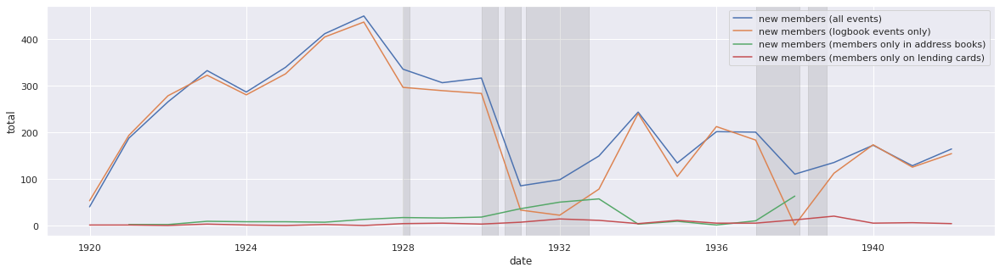

In [92]:
# plot all sets of new members together

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (members only in address books)')
sns.lineplot(data=cardonly_newmembers_by_year, x='date', y='total', label='new members (members only on lending cards)')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

In [93]:
# generate time series of total new subscriptions (sub for a new member) by month, then forecast with prophet as for all logbook activity
# then we can aggregate the estimates the same way

# - and check logbook estimates against new members added from other sources

### new members by first subscription

In [94]:
# to model properly, we only expect membership to start with a subscription
# include renewals, since sometimes they were written down for each other

# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_first_events = member_events[member_events.source_type.str.contains('Logbook') & member_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_id").first().reset_index()
subscription_first_events

,member_id,event_type,date,source_type
0,Cahn-1,Subscription,1919-12-27,Logbook
1,Clauebou-1,Subscription,1941-11-26,Logbook
2,Edward,Renewal,1941-01-22,Logbook
3,abbott,Subscription,1925-04-21,Logbook;Address Book
4,abdul,Subscription,1941-11-27,Logbook
...,...,...,...,...
4315,zimmer,Subscription,1920-01-16,Logbook;Lending Library Card
4316,zogheb,Subscription,1940-01-31,Logbook;Lending Library Card
4317,zongenth,Subscription,1926-11-03,Logbook
4318,zueblin,Subscription,1922-10-18,Logbook


In [95]:
len(subscription_first_events.member_id.unique())

4320

In [96]:
# get new member yearly count based only on subscriptions
newmember_subscriptions_by_year = subscription_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_subscriptions_by_year.rename(columns={'member_id': 'total'}, inplace=True)
newmember_subscriptions_by_year

,date,total
0,1919-12-31,53
1,1920-12-31,192
2,1921-12-31,278
3,1922-12-31,320
4,1923-12-31,275
5,1924-12-31,319
6,1925-12-31,395
7,1926-12-31,400
8,1927-12-31,276
9,1928-12-31,260


<Figure size 1440x576 with 0 Axes>

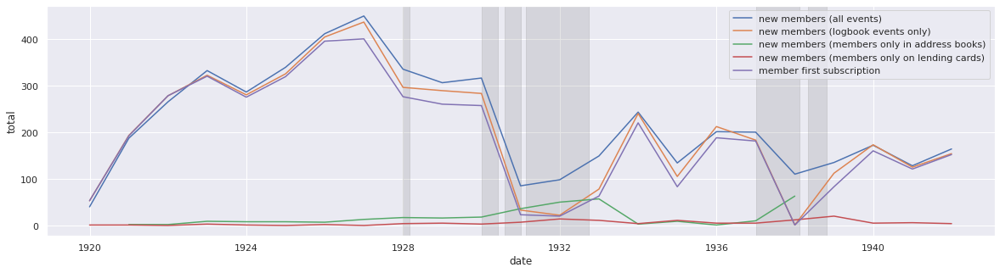

In [97]:
# plot all sets together

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (members only in address books)')
sns.lineplot(data=cardonly_newmembers_by_year, x='date', y='total', label='new members (members only on lending cards)')
sns.lineplot(data=newmember_subscriptions_by_year, x='date', y='total', label='member first subscription')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

first subscription isn't substantially different from all logbook events (which is what we would expect)

In [98]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_subscriptions_by_month = subscription_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
newmember_subscriptions_by_month.rename(columns={'member_id': 'total'}, inplace=True)
newmember_subscriptions_by_month

,date,total
0,1919-11-30,23
1,1919-12-31,30
2,1920-01-31,28
3,1920-02-29,19
4,1920-03-31,20
...,...,...
261,1941-08-31,1
262,1941-09-30,18
263,1941-10-31,26
264,1941-11-30,21


<Figure size 1440x576 with 0 Axes>

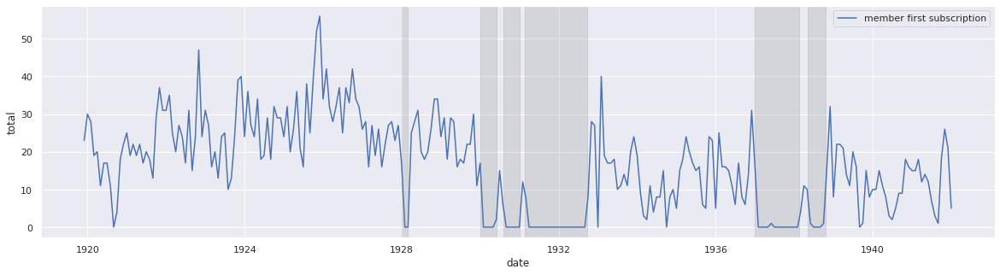

In [99]:

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_subscriptions_by_month, x='date', y='total', label='member first subscription')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

### new logboook members by week


In [100]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_subscriptions_by_week = subscription_first_events.groupby([pd.Grouper(key='date', freq='W')])['member_id'].count().reset_index()
newmember_subscriptions_by_week.rename(columns={'member_id': 'total'}, inplace=True)
newmember_subscriptions_by_week

,date,total
0,1919-11-23,12
1,1919-11-30,11
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1147,1941-11-16,4
1148,1941-11-23,1
1149,1941-11-30,9
1150,1941-12-07,3


<Figure size 1440x576 with 0 Axes>

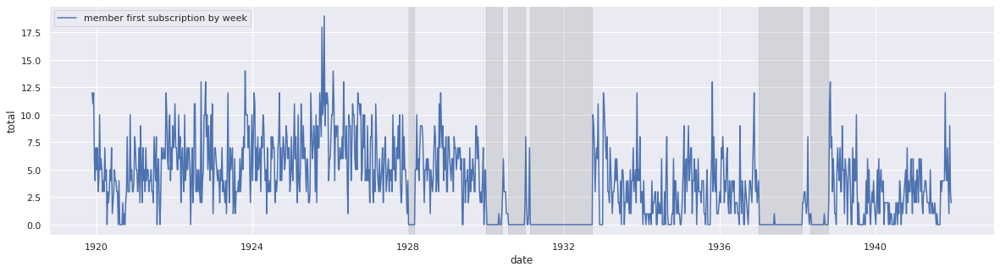

In [101]:

# clear from any previous run
plt.clf()
# setup shared axis
fig, ax = plt.subplots(figsize=(20, 5))

sns.lineplot(data=newmember_subscriptions_by_week, x='date', y='total', label='member first subscription by week')

for i, gap in enumerate(logbook_gaps): 
  gap_start = pd.to_datetime(gap['start'])
  gap_end = pd.to_datetime(gap['end'])
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

## use prophet to forecast missing subscriptions

In [102]:
from datetime import date, timedelta
import math

from prophet import Prophet

# show some number of months before/after the gap and forecast
near_gap = timedelta(days=30 * 6)

# lists to aggregate forecasts and models
all_subs_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  monthly_m = Prophet()
  gap_start = gap['start']
  print('forecasting %s' % gap)

  preceding_data = newmember_subscriptions_by_month[newmember_subscriptions_by_month.date < gap_start]
  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.date >= post1932 ]

  # drop any zeroes, in case that is skewing how prophet fits over the gaps
  preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit thed ata
  monthly_m.fit(preceding_data.rename(columns={'date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = math.ceil(gap['days']/ 30) + 2
  print('gap is %s days, forecast for %0.2f months' % (gap['days'], forecast_for))
  months_future = monthly_m.make_future_dataframe(periods=forecast_for, freq='MS')
  months_fcst = monthly_m.predict(months_future)

  # plot the forecast around our gap
  forecast_near_gap = months_fcst[(months_fcst.ds > (gap_start - near_gap)) & (months_fcst.ds < (gap_end + near_gap))]

  all_subs_forecasts_dfs.append(months_fcst.copy())

# combine all the forecasts into a single df
subscription_forecast = pd.concat(all_subs_forecasts_dfs)

subscription_forecast

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/r68chswm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/v8han8pv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56038', 'data', 'file=/tmp/tmpr6ojztkn/r68chswm.json', 'init=/tmp/tmpr6ojztkn/v8han8pv.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model37f6yzx0/prophet_model-20230113151609.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:16:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


15:16:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 4.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/ipwrvnl8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/pirpodr7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9460', 'data', 'file=/tmp/tmpr6ojztkn/ipwrvnl8.json', 'init=/tmp/tmpr6ojztkn/pirpodr7.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model_ci8ly9d/prophet_model-20230113151610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:16:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:16:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap is 149 days, forecast for 7.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/m5izsdsa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/6lhg6qp9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75847', 'data', 'file=/tmp/tmpr6ojztkn/m5izsdsa.json', 'init=/tmp/tmpr6ojztkn/6lhg6qp9.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelub09grfl/prophet_model-20230113151611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:16:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:16:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap is 152 days, forecast for 8.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/5b4addzh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/80_r786q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11452', 'data', 'file=/tmp/tmpr6ojztkn/5b4addzh.json', 'init=/tmp/tmpr6ojztkn/80_r786q.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelx2jfx052/prophet_model-20230113151612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:16:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:16:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
gap is 586 days, forecast for 22.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/y_zztg99.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/jn_ixs9c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58278', 'data', 'file=/tmp/tmpr6ojztkn/y_zztg99.json', 'init=/tmp/tmpr6ojztkn/jn_ixs9c.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelq843jmec/prophet_model-20230113151612.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:16:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}


15:16:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 411 days, forecast for 16.00 months


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/tii9jurc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/4qyh1grc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55246', 'data', 'file=/tmp/tmpr6ojztkn/tii9jurc.json', 'init=/tmp/tmpr6ojztkn/4qyh1grc.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_modelvxiaedtb/prophet_model-20230113151613.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:16:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}


15:16:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 167 days, forecast for 8.00 months


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-30,21.743680,15.951130,34.560622,21.743680,21.743680,3.522736,3.522736,3.522736,3.522736,3.522736,3.522736,0.0,0.0,0.0,25.266416
1,1919-12-31,21.857736,11.297147,29.847741,21.857736,21.857736,-1.587070,-1.587070,-1.587070,-1.587070,-1.587070,-1.587070,0.0,0.0,0.0,20.270666
2,1920-01-31,21.971791,20.255456,38.827061,21.971791,21.971791,7.450097,7.450097,7.450097,7.450097,7.450097,7.450097,0.0,0.0,0.0,29.421889
3,1920-02-29,22.078489,10.046368,28.691647,22.078489,22.078489,-2.660440,-2.660440,-2.660440,-2.660440,-2.660440,-2.660440,0.0,0.0,0.0,19.418049
4,1920-03-31,22.192544,8.411310,26.497995,22.192544,22.192544,-4.722446,-4.722446,-4.722446,-4.722446,-4.722446,-4.722446,0.0,0.0,0.0,17.470099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,1938-08-01,9.650198,5.747784,22.159977,9.650198,9.650198,4.334429,4.334429,4.334429,4.334429,4.334429,4.334429,0.0,0.0,0.0,13.984627
58,1938-09-01,9.548637,0.440671,16.409256,9.548637,9.548637,-1.494368,-1.494368,-1.494368,-1.494368,-1.494368,-1.494368,0.0,0.0,0.0,8.054269
59,1938-10-01,9.450352,-8.347277,7.571803,9.450352,9.450352,-9.532509,-9.532509,-9.532509,-9.532509,-9.532509,-9.532509,0.0,0.0,0.0,-0.082156
60,1938-11-01,9.348792,0.979520,16.596174,9.348792,9.348792,-0.503015,-0.503015,-0.503015,-0.503015,-0.503015,-0.503015,0.0,0.0,0.0,8.845776


In [103]:
# plot the forecast against our actual data

def plot_subscription_forecast(forecast_df, show_model=False, separate_model_decades=False):
  # use new member subscriptions by month for known values; use all gaps forecast for predictions
  return plot_forecast(newmember_subscriptions_by_month, forecast_df, 
                       forecast_df, show_model=show_model, 
                       separate_model_decades=separate_model_decades)
  

In [104]:
plot_subscription_forecast(subscription_forecast)

<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [105]:
plot_subscription_forecast(subscription_forecast, show_model=True)

<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [106]:
plot_subscription_forecast(subscription_forecast, show_model=True, separate_model_decades=True)

<ipython-input-19-e352be583272>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_pre1932['label'] = "1920s forecast model"
<ipython-input-19-e352be583272>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_post1932["label"] = "1930s forecast model"
<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

alt.LayerChart(...)

### forecast missing subscriptions by week - logistic growth



<ipython-input-107-ccbe5c3162d1>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['cap'] = preceding_data.total.max()
<ipython-input-107-ccbe5c3162d1>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['floor'] = 0
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/y8fgj5ht.json
DE

forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


15:16:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 66 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat


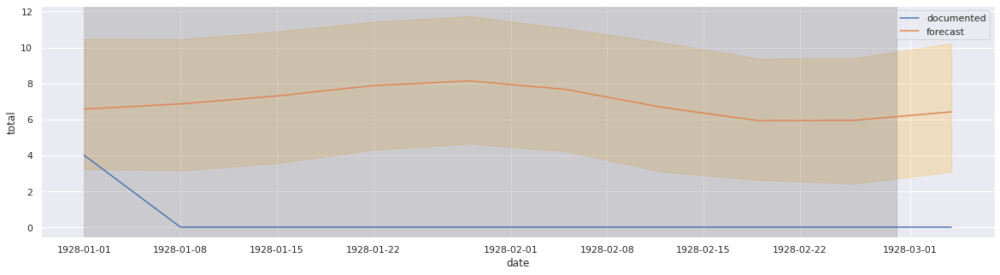

<ipython-input-107-ccbe5c3162d1>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['cap'] = preceding_data.total.max()
<ipython-input-107-ccbe5c3162d1>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['floor'] = 0
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/shx0ytj7.json
DE

forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap is 149 days, forecast for 156 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat


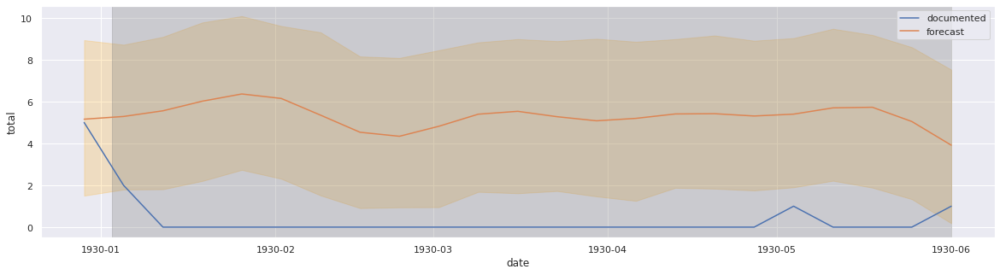

<ipython-input-107-ccbe5c3162d1>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['cap'] = preceding_data.total.max()
<ipython-input-107-ccbe5c3162d1>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['floor'] = 0
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/hi_a6xmw.json
DE

forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap is 152 days, forecast for 159 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat


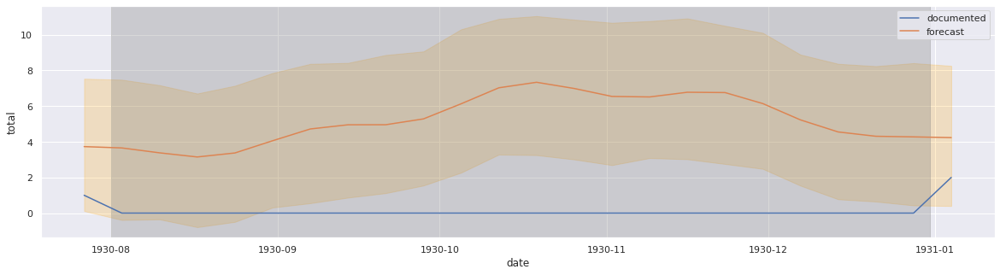

<ipython-input-107-ccbe5c3162d1>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['cap'] = preceding_data.total.max()
<ipython-input-107-ccbe5c3162d1>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preceding_data['floor'] = 0
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/uf64omo2.json
DE

forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
gap is 586 days, forecast for 593 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat


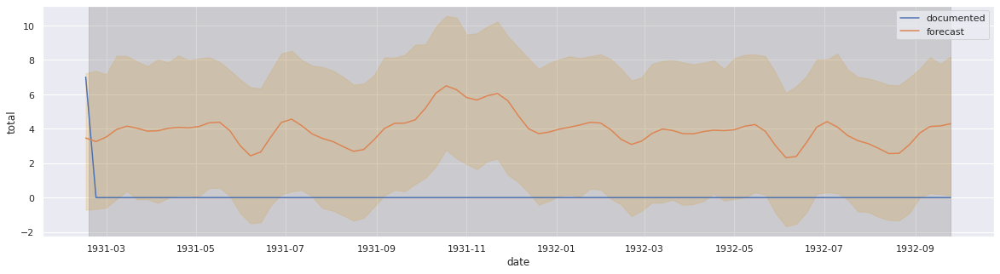

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/mxfao7kh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/17al5b73.json


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10574', 'data', 'file=/tmp/tmpr6ojztkn/mxfao7kh.json', 'init=/tmp/tmpr6ojztkn/17al5b73.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model94fstdsv/prophet_model-20230113151625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:16:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:16:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 411 days, forecast for 418 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
201,1936-12-27,8.140844,2.541041,14.542527,8.140844,8.140844,0.300186,0.300186,0.300186,0.300186,0.300186,0.300186,0.0,0.0,0.0,8.441029
202,1937-01-03,8.134129,0.603686,12.700740,8.134129,8.134129,-1.255883,-1.255883,-1.255883,-1.255883,-1.255883,-1.255883,0.0,0.0,0.0,6.878245
203,1938-02-20,7.737956,-0.583329,11.863865,7.737956,7.737956,-1.986191,-1.986191,-1.986191,-1.986191,-1.986191,-1.986191,0.0,0.0,0.0,5.751766


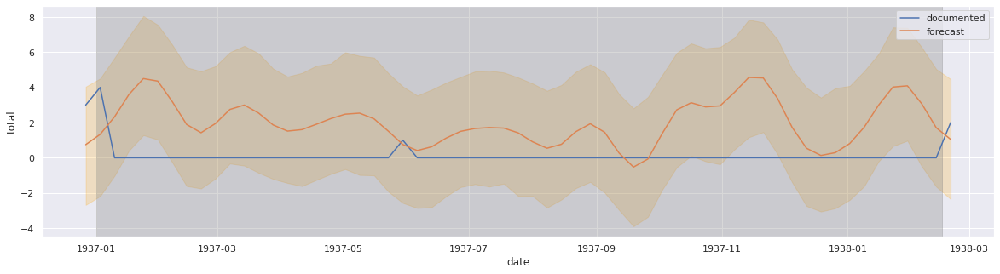

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/d9ul5wbp.json


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr6ojztkn/lq4tdbe2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65512', 'data', 'file=/tmp/tmpr6ojztkn/d9ul5wbp.json', 'init=/tmp/tmpr6ojztkn/lq4tdbe2.json', 'output', 'file=/tmp/tmpr6ojztkn/prophet_model_n9ly789/prophet_model-20230113151629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:16:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:16:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 167 days, forecast for 174 days


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
213,1938-05-01,7.670809,2.926949,15.052315,7.670809,7.670809,1.132682,1.132682,1.132682,1.132682,1.132682,1.132682,0.0,0.0,0.0,8.803490
214,1938-05-08,7.664094,4.208861,15.517019,7.664094,7.664094,2.344224,2.344224,2.344224,2.344224,2.344224,2.344224,0.0,0.0,0.0,10.008318
215,1938-05-15,7.657379,4.520035,16.725179,7.657379,7.657379,3.091493,3.091493,3.091493,3.091493,3.091493,3.091493,0.0,0.0,0.0,10.748872
216,1938-05-22,7.650664,4.475439,15.666321,7.650413,7.650735,2.270825,2.270825,2.270825,2.270825,2.270825,2.270825,0.0,0.0,0.0,9.921489
217,1938-05-29,7.643949,2.495448,14.508055,7.642960,7.644628,0.476375,0.476375,0.476375,0.476375,0.476375,0.476375,0.0,0.0,0.0,8.120324


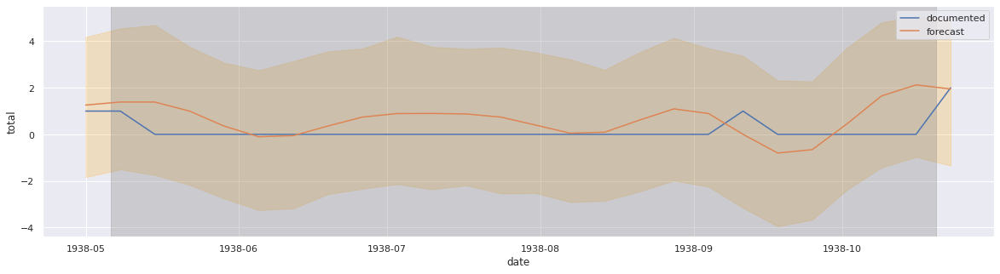

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,5.618307,19,0,4.534008,11.641362,5.618307,5.618307,2.450544,2.450544,2.450544,2.450544,2.450544,2.450544,0.0,0.0,0.0,8.068851
1,1919-11-30,5.613162,19,0,3.840808,10.746790,5.613162,5.613162,1.738401,1.738401,1.738401,1.738401,1.738401,1.738401,0.0,0.0,0.0,7.351563
2,1919-12-07,5.608021,19,0,2.637220,9.679653,5.608021,5.608021,0.577387,0.577387,0.577387,0.577387,0.577387,0.577387,0.0,0.0,0.0,6.185408
3,1919-12-14,5.602882,19,0,1.637034,8.705742,5.602882,5.602882,-0.248724,-0.248724,-0.248724,-0.248724,-0.248724,-0.248724,0.0,0.0,0.0,5.354157
4,1919-12-21,5.597745,19,0,1.637101,8.887678,5.597745,5.597745,-0.397779,-0.397779,-0.397779,-0.397779,-0.397779,-0.397779,0.0,0.0,0.0,5.199967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,1941-08-03,0.440484,13,0,-3.487979,2.798322,0.440483,0.440485,-0.848992,-0.848992,-0.848992,-0.848992,-0.848992,-0.848992,0.0,0.0,0.0,-0.408508
462,1941-08-10,0.437955,13,0,-3.575038,2.448549,0.437954,0.437955,-1.054060,-1.054060,-1.054060,-1.054060,-1.054060,-1.054060,0.0,0.0,0.0,-0.616105
463,1941-08-17,0.435439,13,0,-3.489179,2.617914,0.435439,0.435440,-0.759527,-0.759527,-0.759527,-0.759527,-0.759527,-0.759527,0.0,0.0,0.0,-0.324088
464,1941-08-24,0.432938,13,0,-2.812679,3.409217,0.432937,0.432939,-0.162358,-0.162358,-0.162358,-0.162358,-0.162358,-0.162358,0.0,0.0,0.0,0.270580


In [107]:
# show some number of months before/after the gap and forecast
oneweek = timedelta(days=7)

# lists to aggregate forecasts and models
all_newsub_weekly_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  weekly_m = Prophet(growth='logistic')
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  preceding_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date < gap_start]

  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.date >= post1932 ]

  # drop any zeroes, so prophet doesn't fit to missing data
  # preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit the data
  preceding_data['cap'] = preceding_data.total.max()
  preceding_data['floor'] = 0
  weekly_m.fit(preceding_data.rename(columns={'date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = gap['days'] + 7
  print('gap is %s days, forecast for %d days' % (gap['days'], forecast_for))
  newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')
  newsub_weeks_future['floor'] = 0
  newsub_weeks_future['cap'] = preceding_data.total.max()
  newsub_weeks_fcst = weekly_m.predict(newsub_weeks_future)

  # plot the forecast around our gap
  forecast_near_gap = weeks_fcst[(weeks_fcst.ds > (gap_start - oneweek)) & (weeks_fcst.ds < (gap_end + oneweek))]
  display(forecast_near_gap.head())
  # all_gap_forecasts_dfs.append(forecast_near_gap)

  fig, ax = plt.subplots(figsize=(20, 5))
  newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

  forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
  sns.lineplot(data=newsub_weekly_count_near_gap, x='date', y='total', label='documented', ax=ax)
  sns.lineplot(data=forecast_near_gap, x='ds', y='yhat', label='forecast', ax=ax)
  ax.axvspan(gap_start, gap_end, color="gray", alpha=0.3)
  ax.fill_between(x='ds', y1='yhat_lower', y2='yhat_upper', data=forecast_near_gap, color="orange", alpha=0.2)
  plt.show()

  all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())

# combine all the forecasts into a single df
newsub_weekly_forecasts_dfs = pd.concat(all_newsub_weekly_forecasts_dfs)
# all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

newsub_weekly_forecasts_dfs


### aggregate new subscription weekly estimates

In [108]:

onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)

newsub_weekly_missing = 0
newsub_weekly_missing_upper = 0
newsub_weekly_missing_lower = 0

newsub_weekly_estimates = []

for i, gap in enumerate(logbook_gaps): 
  gap_start = gap['start']
  gap_end = gap['end']
  gap_range = DateTimeRange(gap_start, gap_end)
  # get documented counts for this time period


  gap_counts = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date >= gap_start) & (newmember_subscriptions_by_week.date <= gap_end + oneweek)]
  # now get the forecast for the same weeks
  weekly_forecast = newsub_weekly_forecasts_dfs[(newsub_weekly_forecasts_dfs.ds >= gap_start) & (newsub_weekly_forecasts_dfs.ds <= gap_end + oneweek)]

  for week in gap_counts.itertuples():
    week_start = week.date 

    # do logbook weeks and forecast weeks match?
    # missing estimate is the forecast value minus any actual recorded count for this day
    documented_week = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date == forecast_day.ds]  #.iloc[0]
    # seems possible there's no documented week
    if documented_week.shape[0]:
      documented_week = documented_week.iloc[0]
    else: 
      documented_week = None

    # check if the padding put us past the end of the current gap
    if week_start > gap_end:
      continue

    # get the end of the same month (first of the next month minus one day)
    week_end = week_start + oneweek
    # how many days from this month overlap with our gap?
    gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
    overlap_days = gap_intersection.timedelta.days
    if overlap_days != 7:
      print('gap overlap for %s is %d days' % (week_end, overlap_days))
    # what is our threshold for using the forecast value instead of recorded? 
    # let's try 3 days
    if overlap_days > 3:
      week_total = 0
      if documented_week:
        week_total = week.total

      # get the forecast value for this week
      week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
      # missing estimate is the forecast value minus any actual recorded count for this month
      newsub_weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
      newsub_weekly_missing_upper += (week_forecast.yhat_upper - week_total)
      # cap lower estimate at zero
      newsub_weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

      # aggregate forecast values so we can output as csv for reference
      weekly_estimates.append({
          'date': month_end,
          'documented_total': week_total,
          'gap_days': overlap_days,
          'forecast': week_forecast.yhat,
          'forecast_upper': week_forecast.yhat_upper,
          'forecast_lower': week_forecast.yhat_lower,
          'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
      })

print('''\n\nmissing estimates:
  %s
  upper: %s
  lower: %s''' % (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower))

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
  989.210202062346
  upper: 1804.1320044197005
  lower: 251.91817729909098


In [109]:
# plot the forecast against our actual data

def plot_newsubs_weekly_forecast(forecast_df, show_model=False, separate_model_decades=False):
  # use new member subscriptions by week for known values; use all gaps forecast for predictions
  return plot_forecast(newmember_subscriptions_by_week, forecast_df, 
                       forecast_df, show_model=show_model, 
                       separate_model_decades=separate_model_decades)


In [110]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts_dfs)

<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [111]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts_dfs, show_model=True)

<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [112]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts_dfs, show_model=True, separate_model_decades=True)

<ipython-input-19-e352be583272>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_pre1932['label'] = "1920s forecast model"
<ipython-input-19-e352be583272>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_post1932["label"] = "1930s forecast model"
<ipython-input-19-e352be583272>:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

alt.LayerChart(...)

### aggregate forecast for missing subscriptions

In [121]:
from datetimerange import DateTimeRange
from datetime import date

onemonth = timedelta(days=31)
fivedays = timedelta(days=5)

newsub_missing = 0
newsub_missing_upper = 0
newsub_missing_lower = 0


newsub_estimates = []

for i, gap in enumerate(logbook_gaps): 
  print("gap %i : %s" % (i, gap))
  gap_start = gap['start']
  gap_end = gap['end']
  gap_range = DateTimeRange(gap_start, gap_end)
  # get documented counts for this time period

  # pandas aggregation uses end of month, so mid-month will get the first month count;
  # extend to end by one month to make sure we get the full month for any partials

  gap_counts = newmember_subscriptions_by_month[(newmember_subscriptions_by_month.date >= gap_start) & (newmember_subscriptions_by_month.date <= gap_end + onemonth)]
  print('gap counts')
  print(gap_counts)
  # now get the forecast for the same months
  forecast = subscription_forecast[(subscription_forecast.ds >= gap_start) & (subscription_forecast.ds <= gap_end + onemonth)]

  # these dates don't match exactly! prophet build monthly periodic forecast is different than pandas month grouper;
  # they are usually within a few days of each other, so find them that way
  for month in gap_counts.itertuples():
    # monthly counts uses end of month
    month_end = month.date 
    # get start of the same month
    month_start = date(month_end.year, month_end.month, 1)
    # convert to a date range so we can get the intersecting days
    current_month = DateTimeRange(month_start, month_end)
    # in some cases, because we are extending by a month, there is no overlap;
    # skip those cases
    if not gap_range.is_intersection(current_month):
      print("gap range does not intersect month, skipping")
      continue

    # how many days from this month overlap with our gap?
    gap_intersection = gap_range.intersection(current_month)
    overlap_days = gap_intersection.timedelta.days
    # what is our threshold for using the forecast value instead of recorded? 
    # let's try 10 days
    if overlap_days > 10:
      # get the forecast value for this month
      month_forecast = forecast[(forecast.ds >= month_end - fivedays) & (forecast.ds <= month_end + fivedays) ].iloc[0]
      # missing estimate is the forecast value minus any actual recorded count for this month
      newsub_missing += (month_forecast.yhat - month.total)
      newsub_missing_upper += (month_forecast.yhat_upper - month.total)
      # cap lower estimate at zero
      newsub_missing_lower += max(0, (max(0, month_forecast.yhat_lower) - month.total))

      # aggregate forecast values so we can output as csv for reference
      newsub_estimates.append({
          'date': month_end,
          'documented_total': month.total,
          'gap_days': overlap_days,
          'forecast': month_forecast.yhat,
          'forecast_upper': month_forecast.yhat_upper,
          'forecast_lower': month_forecast.yhat_lower,
          'forecast_range': month_forecast.yhat_upper - month_forecast.yhat_lower,
      })

print('''\n\nmissing subscription estimates:
  %s
  upper: %s
  lower: %s''' % (newsub_missing, newsub_missing_upper, newsub_missing_lower))

gap 0 : {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
gap counts
          date  total       label
98  1928-01-31      0  documented
99  1928-02-29      0  documented
100 1928-03-31     25  documented
gap range does not intersect month, skipping
gap 1 : {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap counts
          date  total       label
122 1930-01-31      0  documented
123 1930-02-28      0  documented
124 1930-03-31      0  documented
125 1930-04-30      0  documented
126 1930-05-31      2  documented
127 1930-06-30     15  documented
gap 2 : {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap counts
          date  total       label
129 1930-08-31      0  documented
130 1930-09-30      0  documented
131 1930-10-31      0  documented
132 1930-11-30      0  documented
133 1930-12-31      0  documented
134 1931-01-31     12  docu

### summarize


In [122]:
newsub_member_total = len(subscription_first_events.member_id.unique())
member_total = len(events_df.member_id.unique())

estimated_total = newsub_member_total + newsub_missing
estimated_total_upper = newsub_member_total + newsub_missing_upper
estimated_total_lower = newsub_member_total + newsub_missing_lower

est_percent = (member_total / estimated_total ) * 100
est_percent_upper = (member_total / estimated_total_upper) * 100


print('''
total unique members: %d
total members from first subscriptions: %d
estimated missing subscriptions: %.2f (upper %.2f, lower %.2f)
estimated total subscriptions from logbooks: %.2f (upper %.2f, lower %.2f)
total missing: %d (upper %d, lower %d)
estimated percent: %.2f (upper %.2f)
 ''' % (member_total, newsub_member_total, 
        newsub_missing, newsub_missing_upper, newsub_missing_lower,
        estimated_total, estimated_total_upper, estimated_total_lower, 
        max(0, estimated_total - member_total),
        estimated_total_upper - member_total,
        max(0, estimated_total_lower - member_total),
        est_percent, est_percent_upper
        ))


total unique members: 5139
total members from first subscriptions: 4320
estimated missing subscriptions: 804.51 (upper 1239.20, lower 412.64)
estimated total subscriptions from logbooks: 5124.51 (upper 5559.20, lower 4732.64)
total missing: 0 (upper 420, lower 0)
estimated percent: 100.28 (upper 92.44)
 


In [134]:
# new sub weekly forecast
# missing estimates:
#   504.61146860119345
#   upper: 667.4846017025017
#   lower: 94.65223975862362


newsub_member_total = len(subscription_first_events.member_id.unique())
member_total = len(events_df.member_id.unique())

estimated_total = newsub_member_total + newsub_weekly_missing
estimated_total_upper = newsub_member_total + newsub_weekly_missing_upper
estimated_total_lower = newsub_member_total + newsub_weekly_missing_lower

est_percent = (member_total / estimated_total) * 100
est_percent_upper = (member_total / estimated_total_upper) * 100
est_percent_lower = (member_total / estimated_total_lower) * 100


print('''
total unique members: %(total_members)d
total members from first subscriptions: %(firstsub_members)d
estimated missing subscriptions: %(missing_subs).2f (upper %(missing_subs_upper).2f, lower %(missing_subs_lower).2f)
estimated total subscriptions from logbooks: %(est_logbook_subs).2f (upper %(est_logbook_subs_upper).2f, lower %(est_logbook_subs_lower).2f)
total missing: %(total_missing)d (upper %(total_missing_upper)d, lower %(total_missing_lower)d)
estimated percent: %(est_percent).2f (upper %(est_percent_upper).2f, lower %(est_percent_lower).2f)
 ''' % {"total_members": member_total, "firstsub_members": newsub_member_total, 
        "missing_subs": newsub_weekly_missing, "missing_subs_upper": newsub_weekly_missing_upper, "missing_subs_lower": newsub_weekly_missing_lower,
        "est_logbook_subs": estimated_total, "est_logbook_subs_upper": estimated_total_upper, "est_logbook_subs_lower": estimated_total_lower, 
        "total_missing": estimated_total - member_total,
        "total_missing_upper": estimated_total_upper - member_total,
        "total_missing_lower": estimated_total_lower - member_total,
        "est_percent": est_percent, "est_percent_upper": est_percent_upper, "est_percent_lower": est_percent_lower
 })


total unique members: 5139
total members from first subscriptions: 4320
estimated missing subscriptions: 989.21 (upper 1804.13, lower 251.92)
estimated total subscriptions from logbooks: 5309.21 (upper 6124.13, lower 4571.92)
total missing: 170 (upper 985, lower -567)
estimated percent: 96.79 (upper 83.91, lower 112.40)
 


In [124]:
# final check, as a lower bound estimates: use member name instead of member id to collapse names, at least some of whom are probably the same person

# missing borrowing activity

In [ ]:
# next steps / todo:
# - adapt borrowing capacity code and combine with KM missing book activity estimates

# need to calculate:
# - number of subscription volumes for subscriptions/members with cards (maybe aggregate by week?)
# - number of book events per week
# use those two numbers to get a ratio of book events per subscription volumes per week

# where we have actual logbook data, we can calculate exactly from known subscriptions without cards
# - where we have logbook gaps, will have to estimate the number of subscription volumes missing...  (not sure how yet...)

### setup


In [ ]:
# subset data for only those with complete start and end dates
date_events = events_df[(events_df.start_date.str.len() > 9) & (events_df.end_date.str.len() > 9)].copy()
# turn start/end dates into datetimes
date_events['start_datetime'] = pd.to_datetime(date_events.start_date, format='%Y-%m-%d', errors='ignore')
date_events['end_datetime'] = pd.to_datetime(date_events.end_date, format='%Y-%m-%d', errors='ignore')
date_events = date_events.sort_values(by=['start_datetime'])
date_events.head()

#### identify borrowing and subscription events

In [ ]:
# borrow events 
borrow_events = date_events[date_events.event_type == 'Borrow']

# subset data for subscription events with complete dates
subscription_events = date_events[date_events.event_type.isin(['Subscription', 'Renewal', 'Supplement'])].copy()

In [ ]:
# some subscriptions (~377) do not have subscription volume documented;
# subscription volume is 1 at minumim
subscription_events["subscription_volumes"] = subscription_events.subscription_volumes.apply(lambda x: x if pd.notna(x) else 1)

In [ ]:
# date range for subscriptions
earliest_date = date_events.start_datetime.iloc[0]
# end date for the last subscription
subs_end_date = subscription_events.end_datetime.max()

In [ ]:
# load members
members_df = pd.read_csv(csv_urls['members'])

# for now, use has card to identify borrows that belong to subscriptions (but this is approximate)
member_subs = subscription_events.copy()
member_subs[['first_member_uri','second_member_uri']] = member_subs.member_uris.str.split(';', expand=True)
# handle multiple member uris (joint accounts) in subscriptions by merging on the first one (has card should be same)
member_subs = pd.merge(left=member_subs, right=members_df, left_on="first_member_uri", right_on="uri")
member_subs = member_subs[member_subs.has_card]


In [ ]:
# make a copy of the dataframe so pandas won't complain about setting values on a slice
subscriptions_df = subscription_events.copy()

def borrows_within_sub(subscription):
  # identify and count any borrow events that *start* during this subscription
  # (do we want start or any overlap? start matters more when estimating book events)
  return len(borrow_events[(borrow_events.member_id == subscription.member_id) & 
              (subscription.start_date <= borrow_events.start_date) & (borrow_events.start_date <= subscription.end_date)])

subscriptions_df['documented_borrows'] = subscriptions_df.apply(borrows_within_sub, axis=1)
subscriptions_df.head()

In [ ]:
# check — example subscriptions with no borrows
subscriptions_df[subscriptions_df.documented_borrows == 0].head()

In [ ]:
# check — example subscriptions with at least one borrow
subscriptions_df[subscriptions_df.documented_borrows > 0].head()

In [ ]:
# identify the subset of subscriptions with at least one borrow event
subs_with_borrows = subscriptions_df[subscriptions_df.documented_borrows > 0]

In [ ]:
# identify borrow events that fall within a subscription
borrow_events_df = borrow_events.copy()

def borrow_within_subscription(borrow):
  return bool(len(subscriptions_df[(subscriptions_df.member_id == borrow.member_id) & 
              (subscriptions_df.start_date <= borrow.start_date) &
              (subscriptions_df.end_date >= borrow.start_date)]))

borrow_events_df['within_subscription'] = borrow_events_df.apply(borrow_within_subscription, axis=1)


In [ ]:
# check to confirm
borrow_events_df[~borrow_events_df.within_subscription]

In [ ]:
borrows_within_subscriptions = borrow_events_df[borrow_events_df.within_subscription]

In [ ]:
from datetime import date, timedelta
# arbritrary end date while testing
#end_day = date(1925, 6, 1)
# go through end of last subscription end date
#end_day = subs_end_date
one_day = timedelta(days=1)
# start with the earliest start date
day = date_events.start_datetime.iloc[0]

dates = []
books_out = []
borrow_events_perday = []
subscription_vols = []
card_subscription_vols = []
book_subscription_vols = []


while day < subs_end_date:
    dates.append(day)
    # get total number of borrowing events spanning this date; include start date, exclude end (to avoid double counting)
    books_out.append(len(borrows_within_subscriptions[(borrows_within_subscriptions.start_datetime <= day) & (borrows_within_subscriptions.end_datetime > day)]))
    # total number of volumes from active subscriptions for this date
    subscription_vols.append(subscription_events[(subscription_events.start_datetime <= day) & (day < subscription_events.end_datetime)].subscription_volumes.sum())
    # total number of volumes from subscriptions for members with extant cards
    card_subscription_vols.append(member_subs[(member_subs.start_datetime <= day) & (day < member_subs.end_datetime)].subscription_volumes.sum())

    # total number of volumes from subscriptions for subscriptions with at least one borrow event
    book_subscription_vols.append(subs_with_borrows[(subs_with_borrows.start_datetime <= day) & (day < subs_with_borrows.end_datetime)].subscription_volumes.sum())

    # count actual borrow events that started on this date
    borrow_events_perday.append(len(borrow_events[borrow_events.start_datetime == day]))

    day += one_day

borrowing_df  = pd.DataFrame()
borrowing_df['date'] = dates
borrowing_df['books_out'] = books_out
borrowing_df['borrow_event_count'] = borrow_events_perday
borrowing_df['subscription_volumes'] = subscription_vols
borrowing_df['card_subscription_volumes'] = card_subscription_vols
borrowing_df['book_subscription_volumes'] = book_subscription_vols
borrowing_df

In [ ]:
# where do card member subs and book subs differ?
borrowing_df[borrowing_df.card_subscription_volumes != borrowing_df.book_subscription_volumes]

In [ ]:
# what is the ratio of subscriptions to borrow events?
borrowing_df['book_events_per_subscription_vol'] = borrowing_df.apply(lambda x: x.borrow_event_count / x.book_subscription_volumes, axis=1)
borrowing_df

In [ ]:
borrowing_df['book_events_per_subscription_vol'].describe()

In [ ]:
# aggregate subscriptions by day so that we can get a weekly/monthly average of the _total_ subscription volumes

borrowing_daily = borrowing_df.groupby([pd.Grouper(key='date', freq='D')]) \
  .agg({'book_subscription_volumes':'sum',
        'borrow_event_count': 'sum', 'card_subscription_volumes':'sum', 
        'book_subscription_volumes': 'sum', 
        'subscription_volumes': 'sum'}).reset_index()
borrowing_daily.head(13)

In [ ]:
# counting by day is too small, we need to aggregate a bit; let's try weekly
# borrowing_weekly = borrowing_df.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum', 'card_subscription_volumes':'mean', 'book_subscription_volumes': 'mean', 'subscription_volumes': 'mean'})
# borrowing_weekly = borrowing_weekly.reset_index()
# borrowing_weekly

# take an average of the total subscription volumes by day; count up all the borrow events during the week
# (or do we actually want the maximum?!)
# borrowing_weekly = borrowing_daily.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum', 'card_subscription_volumes':'mean', 'book_subscription_volumes': 'mean', 'subscription_volumes': 'mean'})
borrowing_weekly = borrowing_daily.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'max','borrow_event_count': 'sum', 'card_subscription_volumes':'max', 'book_subscription_volumes': 'mean', 'subscription_volumes': 'max'})
borrowing_weekly = borrowing_weekly.reset_index()
borrowing_weekly


In [ ]:
borrowing_weekly.borrow_event_count.describe()

In [ ]:
borrowing_weekly['ratio'] = borrowing_weekly.apply(lambda row: row.borrow_event_count / row.book_subscription_volumes, axis=1)
borrowing_weekly.ratio.describe()

In [ ]:

# get current axis so we can plot two series on the same axis
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7), title='book events + total subscription volumes (by week)')
borrowing_weekly.plot(kind='line',x='date',y='borrow_event_count', color='green', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='ratio', color='orange', ax=ax)


plt.show()


In [ ]:
# how different are card volumes and book subscription volumes?

ax = plt.gca()
borrowing_weekly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='card_subscription_volumes', color='green', ax=ax)

plt.show()

This looks like what we expect: we know more cards are missing in the earlier years, so if we key on the member "has card" flag, we include subscriptions in the earlier time period when we don't actually have documented borrowing activity.

In [ ]:
# let's try aggregating by month
# borrowing_monthly = borrowing_df.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum'})
# borrowing_monthly = borrowing_monthly.reset_index()
# borrowing_monthly

# borrowing_monthly = borrowing_daily.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum'})

borrowing_monthly = borrowing_daily.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'max','borrow_event_count': 'sum'})
borrowing_monthly = borrowing_monthly.reset_index()
borrowing_monthly


In [ ]:
borrowing_monthly.borrow_event_count.describe()

In [ ]:
borrowing_monthly['ratio'] = borrowing_monthly.apply(lambda row: row.borrow_event_count / row.book_subscription_volumes, axis=1)
borrowing_monthly.ratio.describe()

In [ ]:
# get current axis so we can plot two series on the same axis
ax = plt.gca()

borrowing_monthly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7), title='book events + average book subscription volumes (by month)')
borrowing_monthly.plot(kind='line',x='date',y='borrow_event_count', color='green', ax=ax)
borrowing_monthly.plot(kind='line',x='date',y='ratio', color='orange', ax=ax)


plt.show()

In [ ]:
# if we plot just the ratio, how stable is it?
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='ratio', color='blue', ax=ax)
borrowing_monthly.plot(kind='line',x='date',y='ratio', color='green', ax=ax)

# monthly ratio average
#plt.axhline(y=2.858, color='yellow', linestyle='-')  # 2.8 is ratio when we use average subscription
plt.axhline(y=2.6, color='yellow', linestyle='-')  # 2.6 is ratio when we use max # subscriptions


# weekly ratio average
plt.axhline(y=0.663, color='purple', linestyle='-')  # weekly ratio doesn't change noticeably when we switch from mean to max

plt.show()

In [ ]:
# ok, now apply our ratio to the non-book subscription volumes
borrowing_weekly['non_book_subs_vols'] = borrowing_weekly.apply(lambda row: row.subscription_volumes - row.book_subscription_volumes, axis=1)
borrowing_weekly.head()

In [ ]:
borrow_events_per_subsvol = borrowing_weekly.ratio.mean()
borrow_events_per_subsvol

In [ ]:
borrowing_weekly['estimated_borrow_events'] = borrowing_weekly.non_book_subs_vols.apply(lambda x: x * borrow_events_per_subsvol)
borrowing_weekly

In [ ]:
# plot with our estimates
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='non_book_subs_vols',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='estimated_borrow_events', color='green', ax=ax)


plt.show()

In [ ]:
# now combine and plot the total

ax = plt.gca()
# tally up our estimate with the actual event count
borrowing_weekly['total_estimated_borrow_events'] = borrowing_weekly.apply(lambda row: row.estimated_borrow_events + row.borrow_event_count, axis=1)


borrowing_weekly.plot(kind='line',x='date',y='subscription_volumes',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='total_estimated_borrow_events', color='green', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='estimated_borrow_events', color='lightgreen', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='borrow_event_count', color='lightblue', ax=ax)


plt.show()

In [ ]:
ax = plt.gca()
# total subscriptoin volumes
borrowing_weekly.plot(kind='line',x='date',y='subscription_volumes',ax=ax)
# stacked area chart of actual borrows and estimated missing 
borrowing_weekly[['date', 'borrow_event_count', 'estimated_borrow_events']].plot.area(x='date', stacked=True, ax=ax)
# line plot the total over the stack (not really helpful)
# borrowing_weekly.plot(kind='line',x='date',y='total_estimated_borrow_events', color='yellow', ax=ax)




In [ ]:
# how about some numbers?

# total number of estimated missing borrow events based on known subscriptions
est_total_missing_borrows = borrowing_weekly.estimated_borrow_events.sum()
est_total_missing_borrows

In [ ]:
# how many borrow events did we use to generate our estimate? 
total_borrows_used_to_estimate =  borrows_within_subscriptions.shape[0]
total_borrows_used_to_estimate

In [ ]:
# how many borrows do we have total? (with/without dates)
# (todo: exclude after last subscription ?)
total_borrows = events_df[events_df.event_type == 'Borrow'].shape[0]
total_borrows 

In [ ]:
total_borrows - total_borrows_used_to_estimate  

In [ ]:
# estimated total based on subscriptions
est_total = est_total_missing_borrows + total_borrows_used_to_estimate
est_total

In [ ]:
total_borrows / est_total


Kevin's estimates from the draft 
> model estimates a total of 80,000 borrowing events, of which 21,767 are included in the dataset before 1942, meaning we expect as many as 58,000 book events are likely missing from the record. This indicates that about 27 percent of the borrowing activity for the Shakespeare and Company lending library is recorded


this estimate is 65,780 missing borrow events for 83,072 total, and 21,059 borrow events documented (total is different, is Kevin's from v1.1 data? or did he use all book events instead of just borrows?)

this is actually an under count, because it's only based on known subscriptions; we are still missing some subscriptions in the logbook gaps

(check: how many known subscriptions without dates/duration were excluded from these estimates? how many subscriptions with unknown volumes did we assume single volume?)
